In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 5.6 MB/s eta 0:00:00


In [ ]:
!pip install gensim

In [ ]:
from datasets import load_dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Download NLTK stop words
nltk.download('stopwords')
nltk.download('punkt')

import itertools


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Step 1: Load the dataset

In [ ]:
dataset = load_dataset("orieg/elsevier-oa-cc-by")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1461: FutureWarning: The repository for orieg/elsevier-oa-cc-by contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/orieg/elsevier-oa-cc-by
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datas

Generating train split:   0%|          | 0/32072 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/4008 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/4009 [00:00<?, ? examples/s]

In [ ]:
elsevier_dataset = dataset

In [ ]:
print(elsevier_dataset)

DatasetDict({
    train: Dataset({
        features: ['title', 'abstract', 'subjareas', 'keywords', 'asjc', 'body_text', 'author_highlights'],
        num_rows: 32072
    })
    test: Dataset({
        features: ['title', 'abstract', 'subjareas', 'keywords', 'asjc', 'body_text', 'author_highlights'],
        num_rows: 4008
    })
    validation: Dataset({
        features: ['title', 'abstract', 'subjareas', 'keywords', 'asjc', 'body_text', 'author_highlights'],
        num_rows: 4009
    })
})


In [ ]:
train_set = elsevier_dataset['train']
train_df = pd.DataFrame(train_set)
print("Shape of the training set:", train_df.shape)


Shape of the training set: (32072, 7)


In [ ]:
val_set = elsevier_dataset['validation']
val_df = pd.DataFrame(val_set)

test_set = elsevier_dataset['test']
test_df = pd.DataFrame(test_set)

In [ ]:
print(val_df.shape)
print(test_df.shape)

(4009, 7)
(4008, 7)


In [ ]:
print(train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32072 entries, 0 to 32071
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   title              32072 non-null  object
 1   abstract           32072 non-null  object
 2   subjareas          32072 non-null  object
 3   keywords           32072 non-null  object
 4   asjc               32072 non-null  object
 5   body_text          32072 non-null  object
 6   author_highlights  32072 non-null  object
dtypes: object(7)
memory usage: 1.7+ MB
None


In [ ]:
train_df.head()

,title,abstract,subjareas,keywords,asjc,body_text,author_highlights
0,Extending the GERG-2008 equation of state: Imp...,The Groupe Européen de Recherches Gazières (GE...,"[CHEM, MATE, PHYS]","[Binary mixture, Butane, Equation of state, GE...","[1606, 2500, 3107]",[Accurate equations of state (EOS) for natural...,[The GERG-2008 EOS was tested against recently...
1,Epidemiology of breast cancer in Cyprus: Data ...,This article presents analyzed data on new dia...,[MULT],[],[1000],[This article includes analyzed data on breast...,[]
2,Maternal Inheritance of a Single Somatic Anima...,Bacteriocytes are insect cells harboring symbi...,"[AGRI, BIOC]","[bacteriocyte, cellular immortality, maternal ...","[1100, 1300]",[Our first experiment scored the genetic varia...,[Whitefly bacteriocytes have different microsa...
3,Geochemical and palynological sea-level proxie...,Geochemical and palynological records are pres...,"[AGRI, EART]","[Chemostratigraphy, Cretaceous, Dinoflagellate...","[1105, 1904, 1910, 1911]",[Sea-level change represents a major driver of...,[Basin-wide sediment geometries have been used...
4,Data on hyper-activation of GPVI signalling in...,This data article is associated with the manus...,[MULT],[],[1000],[We performed a combination of 2D-DIGE-based p...,[]


In [ ]:

label_counts = pd.Series([label for sublist in train_df['subjareas'] for label in sublist]).value_counts()
label_counts_df = label_counts.reset_index()
label_counts_df.columns = ['Subject Area', 'Frequency']
label_counts_df = label_counts_df.sort_values('Frequency', ascending=False)

fig = px.bar(label_counts_df, x='Frequency', y='Subject Area', orientation='h',
             title='Distributon of Subject Areas')

fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    height=600,
    width=800
)

fig.show()


In [ ]:
def word_count(text):
    return len(str(text).split())

train_df['word_count'] = train_df['body_text'].apply(word_count)

average_word_count = train_df['word_count'].mean()

average_word_count


4781.13485283113

In [ ]:
train_df['keyword_count'] = train_df['keywords'].apply(lambda x: len(x))

average_keywords = train_df['keyword_count'].max()

print(f"The max numne of keywords: {average_keywords}")


The max numne of keywords: 47


In [ ]:
train_df['keyword_count'] = train_df['keywords'].apply(lambda x: len(x))

average_keywords = train_df['keyword_count'].mean()

print(f"The max numne of keywords: {average_keywords}")


The max numne of keywords: 4.802849837864804


In [ ]:
def word_count(text):
    return len(str(text).split())

train_df['word_count'] = train_df['body_text'].apply(word_count)

average_word_count = train_df['word_count'].max()

average_word_count


69346

In [ ]:
def word_count(text):
    return len(str(text).split())

train_df['highlights_count'] = train_df['author_highlights'].apply(word_count)

average_word_count = train_df['highlights_count'].mean()

average_word_count


31.469849089548514

In [ ]:
def adjust_subjareas(subjareas_list):
    if any(area in subjareas_list for area in ['VETE', 'HEAL', 'DENT', 'NURS']):
        return ['MEDI']
    elif any(area in subjareas_list for area in ['ECON', 'ARTS', 'BUSI', 'DECI']):
        return ['SOCI']
    elif 'MATH' in subjareas_list:
        return ['MULT']
    else:
        return subjareas_list

train_df['subjareas'] = train_df['subjareas'].apply(adjust_subjareas)
val_df['subjareas'] = val_df['subjareas'].apply(adjust_subjareas)
test_df['subjareas'] = test_df['subjareas'].apply(adjust_subjareas)

In [ ]:
train_df['body_text_count'] = train_df['body_text'].apply(lambda x: len(x))

average_keywords = train_df['body_text_count'].max()

print(f"The max numne of keywords: {average_keywords}")


Data Exploration

In [ ]:
total_rows = len(train_df)
null_percentage = train_df.isnull().sum() / total_rows * 100
columns_with_80_percent_nulls = null_percentage[null_percentage > 50].index.tolist()
print(columns_with_80_percent_nulls)


[]


In [ ]:
asjc_descriptions_start_digits = {
    '11': 'Agricultural and Biological Sciences',
    '12': 'Arts and Humanities',
    '13': 'Biochemistry, Genetics and Molecular Biology',
    '14': 'Business, Management and Accounting',
    '15': 'Chemical Engineering',
    '16': 'Chemistry',
    '17': 'Computer Science',
    '18': 'Decision Sciences',
    '19': 'Earth and Planetary Sciences',
    '20': 'Economics, Econometrics and Finance',
    '21': 'Energy',
    '22': 'Engineering',
    '23': 'Environmental Science',
    '24': 'Immunology and Microbiology',
    '25': 'Materials Science',
    '26': 'Mathematics',
    '27': 'Medicine',
    '28': 'Neuroscience',
    '29': 'Nursing',
    '30': 'Pharmacology, Toxicology and Pharmaceutics',
    '31': 'Physics and Astronomy',
    '32': 'Psychology',
    '33': 'Social Sciences',
    '34': 'Veterinary',
    '35': 'Dentistry',
    '36': 'Health Professions',
    '1000': 'Multidisciplinary'
}

def map_code_to_description(code, mapping):
    if code == '1000':
        return ["Multidisciplinary"]
    # Extract the first two digits of the ASJC code
    prefix = str(code)[:2]
    # Look up the description using the prefix
    return mapping.get(prefix, 'Unknown')

train_df['asjc_descriptions'] = train_df['asjc'].apply(
    lambda codes: [map_code_to_description(code, asjc_descriptions_start_digits) for code in codes]
)


In [ ]:
train_df.head(2)

,title,abstract,subjareas,keywords,asjc,body_text,author_highlights,word_count,highlights_count,asjc_descriptions
0,Accounting colonisation and austerity in arts ...,This Habermasian qualitative study considers t...,[SOCI],"[Accounting colonisation, Accounting monitorin...","[1402, 1802, 2003, 3312]",[This study adopts a Habermasian approach to e...,[],13948,1,"[Business, Management and Accounting, Decision..."
1,Skim milk powder with high content of Maillard...,Background: The intestinal tract is important ...,"[AGRI, PHAR]","[Autoimmune diseases, Immune tolerance, Inflam...","[1106, 3005]",[Hypersensitivity and autoimmune disorders lik...,[Maillard products were formed in skim milk po...,3611,41,"[Agricultural and Biological Sciences, Pharmac..."


In [ ]:
title_lengths = train_df['title'].str.split().str.len()

max_length = title_lengths.max()
average_length = title_lengths.mean()
min_length = title_lengths.min()

max_length, average_length, min_length


(49, 13.979577201297081, 1)

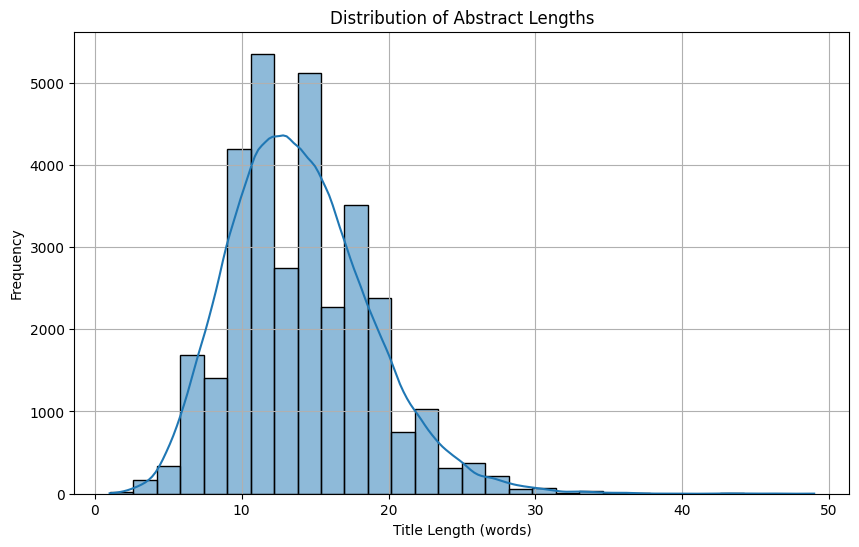

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(title_lengths, bins=30, kde=True)
plt.title('Distribution of Abstract Lengths')
plt.xlabel('Title Length (words)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

Exploratory Data Analysis


1. Frequency *Distribution of Target Vraiable "subjareas"

   The plot below gives the frequency distribution of the subarea

In [ ]:
import pandas as pd
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary
from gensim.parsing.preprocessing import STOPWORDS
from gensim.utils import simple_preprocess
from nltk.stem import WordNetLemmatizer, SnowballStemmer
import numpy as np

processed_docs = [
    ['water', 'state', 'three', 'rain'],
    ['still', 'hour', 'sleeping'],
    ['percent', 'water', 'rain', 'state']
]

dictionary = Dictionary(processed_docs)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

np.random.seed(1)
lda_model = LdaModel(corpus, num_topics=3, id2word=dictionary, passes=10)

lda_features = []

for doc_bow in corpus:
    doc_topics = lda_model.get_document_topics(doc_bow, minimum_probability=0)
    doc_features = [prob for _, prob in doc_topics]
    lda_features.append(doc_features)

# Convert LDA features to a DataFrame
feature_df = pd.DataFrame(lda_features, columns=['Topic_{}'.format(i) for i in range(1, 4)])

feature_df.head()


,Topic_1,Topic_2,Topic_3
0,0.067228,0.068062,0.864710
1,0.831576,0.084793,0.083631
2,0.067228,0.068066,0.864706


In [ ]:
label_counts = pd.Series([label for sublist in train_df['subjareas'] for label in sublist]).value_counts()
label_counts_df = label_counts.reset_index()
label_counts_df.columns = ['Subject Area', 'Frequency']

fig = px.bar(label_counts_df, x='Subject Area', y='Frequency', title='Frequency of Each Subject Area Label')
fig.show()


Lets try to drop all the subjareas that have a three digit frequency count in our data

In [ ]:
subjects_to_drop = ['VETE', 'ECON', 'ARTS', 'BUSI', 'HEAL', 'MATH', 'DECI', 'DENT', 'NURS']

filtered_df = train_df[~train_df['subjareas'].apply(lambda x: any(subj in x for subj in subjects_to_drop))]
filtered_df.shape

(32072, 10)

Check for th subjareas distribution again

In [ ]:
label_counts = pd.Series([label for sublist in filtered_df['subjareas'] for label in sublist]).value_counts()
label_counts_df = label_counts.reset_index()
label_counts_df.columns = ['Subject Area', 'Frequency']

fig = px.bar(label_counts_df, x='Subject Area', y='Frequency', title='Frequency of Each Subject Area Label')
fig.show()


In [ ]:
train_df['keyword_count'] = train_df['keywords'].apply(lambda x: len(x))

average_keywords = train_df['keyword_count'].mean()

print(f"The average number of keywords per abstract is: {average_keywords}")


The average number of keywords per abstract is: 4.793651783487154


In [ ]:
train_df['keyword_count'] = train_df['keywords'].apply(lambda x: len(x))

average_keywords = train_df['keyword_count'].max()

print(f"The max numne of keywords: {average_keywords}")


The max numne of keywords: 34


Average count of words in body_text

In [ ]:
train_df['body_text_count'] = train_df['body_text'].apply(lambda x: len(x))

average_keywords = train_df['body_text_count'].max()

print(f"The max numne of keywords: {average_keywords}")


In [ ]:
def calculate_average_words(df, column_name):
    # Count the number of words in each row
    df['word_count'] = df[column_name].apply(lambda x: len(str(x).split()) if pd.notnull(x) else 0)
    # Calculate the average number of words
    average_words = df['word_count'].mean()
    return average_words

# Call the function and pass the 'author_highlights' column
average_words_in_highlights = calculate_average_words(train_df, 'author_highlights')
average_words_in_highlights

1.0

In [ ]:
train_df['subjareas'] = train_df['subjareas'].astype(str).replace('nan', '')

comp_subjareas_df = train_df[train_df['subjareas'].str.contains('COMP')]

comp_keywords = comp_subjareas_df[['keywords', 'abstract']]
print(comp_keywords)


                                                keywords  \
4      [Distributed scatterers, Landslides, Optimized...   
12     [Clustering, Electroglottography, Sample entro...   
49     [Asymmetric rotor, Bearing waviness, Paper mac...   
58     [3D imaging, Leaf disease, Leaf venation, Phot...   
63     [Cancer recurrence, Cancer survival, Cancer su...   
...                                                  ...   
32006  [Activin/TGFβ, Cancer, ECM stiffness, Growth f...   
32026  [Autonomous vehicles, Obstacle detection, Path...   
32032  [Bayesian networks, Chronic kidney disease, Po...   
32057  [3D bioprinting, 3D printing, Medical phantom,...   
32064  [Content recommendation, Context modeling, Con...   

                                                abstract  
4      Long-term InSAR techniques, such as Persistent...  
12     From soft to loud and low to high, the mechani...  
49     This paper presents a simulation method that i...  
58     Leaf venation extraction studies hav

In [ ]:

comp_subareas_df = train_df[train_df['subjareas'].apply(lambda x: 'COMP' in x)]

print(comp_subareas_df['keywords'])


4        [Distributed scatterers, Landslides, Optimized...
12       [Clustering, Electroglottography, Sample entro...
49       [Asymmetric rotor, Bearing waviness, Paper mac...
58       [3D imaging, Leaf disease, Leaf venation, Phot...
63       [Cancer recurrence, Cancer survival, Cancer su...
                               ...                        
32006    [Activin/TGFβ, Cancer, ECM stiffness, Growth f...
32026    [Autonomous vehicles, Obstacle detection, Path...
32032    [Bayesian networks, Chronic kidney disease, Po...
32057    [3D bioprinting, 3D printing, Medical phantom,...
32064    [Content recommendation, Context modeling, Con...
Name: keywords, Length: 1624, dtype: object


In [ ]:
def count_subarea_combinations(df, subarea_column, specific_subarea):
    """
    Count the occurrences of all unique combinations that include a specific subarea.

    Parameters:
    df (pd.DataFrame): The dataframe containing the subject areas.
    subarea_column (str): The name of the column containing the subject areas.
    specific_subarea (str): The specific subarea to look for in the combinations.

    Returns:
    pd.DataFrame: A dataframe with each combination including the specific subarea and its count.
    """
    combinations = {}

    for subareas in df[subarea_column]:
        if specific_subarea in subareas:
            key = tuple(sorted([s for s in subareas if s != specific_subarea]))
            combinations[key] = combinations.get(key, 0) + 1

    combination_counts = [{'combination': f"{specific_subarea}, " + ', '.join(combo), 'count': count}
                           for combo, count in combinations.items()]

    combination_counts_df = pd.DataFrame(combination_counts)

    total_count = combination_counts_df['count'].sum()

    total_count_series = pd.Series({'combination': 'Total', 'count': total_count})
    combination_counts_df = combination_counts_df.append(total_count_series, ignore_index=True)

    return combination_counts_df

count_subarea_combinations(train_df, 'subjareas', 'BIOC')

<ipython-input-17-f9ad1cc572f8>:28: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,combination,count
0,"BIOC, MATH",160
1,"BIOC, CENG, ENGI",36
2,"BIOC,",1649
3,"BIOC, AGRI",570
4,"BIOC, IMMU, MEDI, VETE",626
...,...,...
56,"BIOC, ENGI, MATE, PHYS",1
57,"BIOC, CENG, CHEM, ENVI, MATE",2
58,"BIOC, COMP, ENGI",1
59,"BIOC, ENVI, PHAR",1


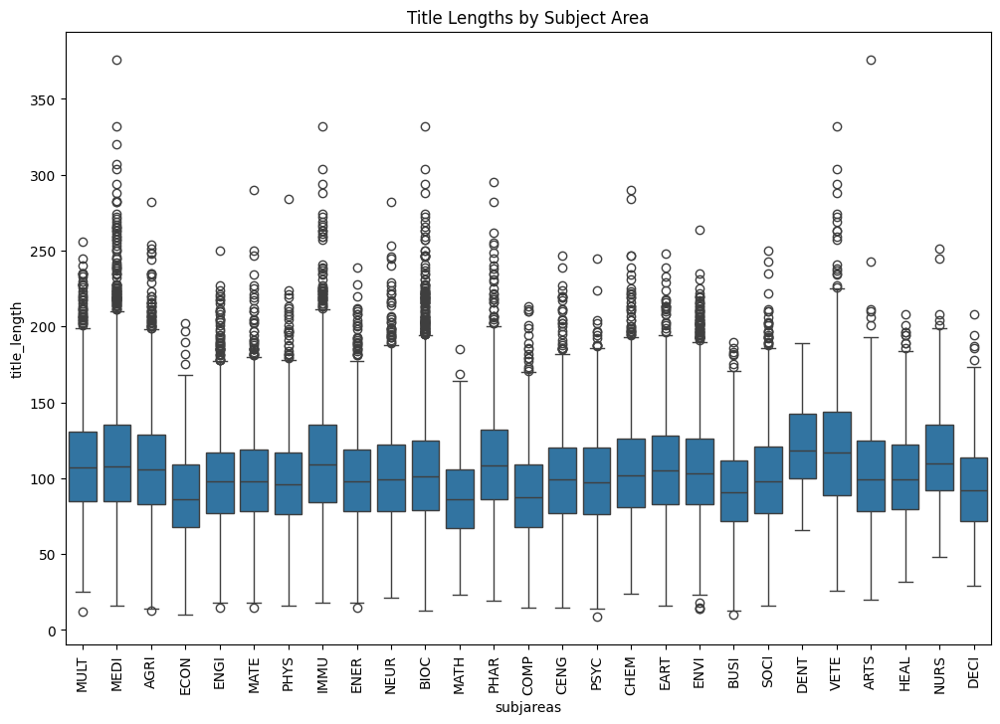

In [ ]:

flattened_df = train_df.explode('subjareas')
flattened_df['title_length'] = flattened_df['title'].apply(len)

# Now, we create a boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='subjareas', y='title_length', data=flattened_df)
plt.xticks(rotation=90)
plt.title('Title Lengths by Subject Area')
plt.show()


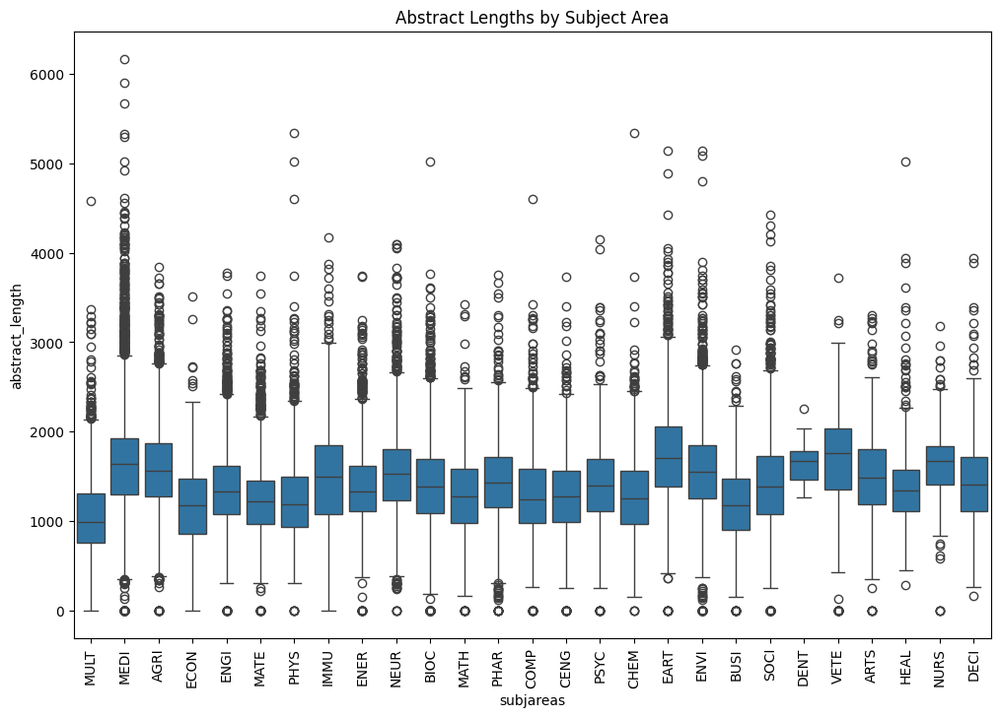

In [ ]:

flattened_df = train_df.explode('subjareas')
flattened_df['abstract_length'] = flattened_df['abstract'].apply(len)

# Now, we create a boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='subjareas', y='abstract_length', data=flattened_df)
plt.xticks(rotation=90)
plt.title('Abstract Lengths by Subject Area')
plt.show()


<ipython-input-20-885e0736f3f6>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='triplet', data=df_top_triplets, palette='viridis')


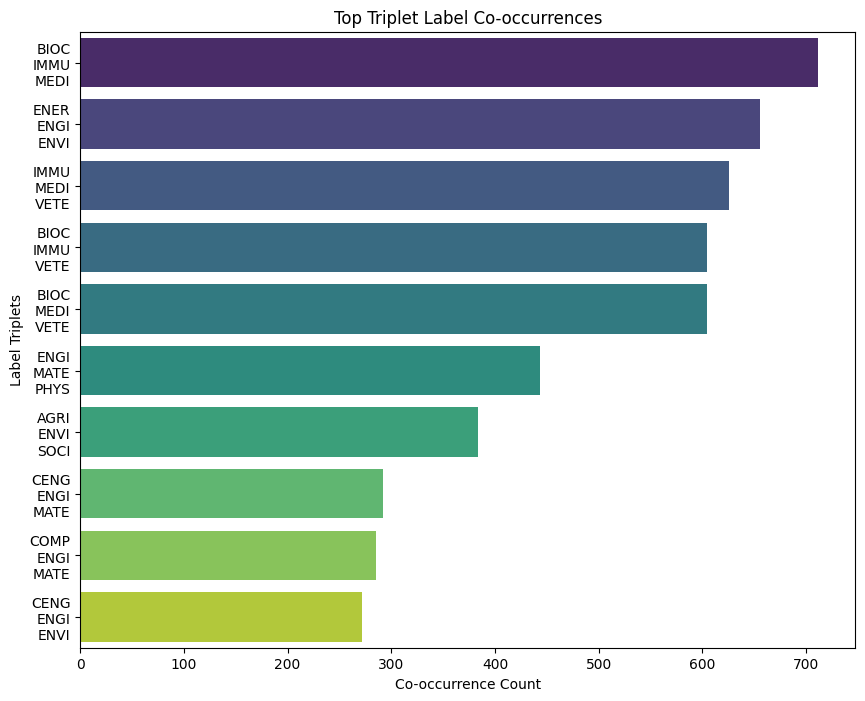

In [ ]:
triplet_co_occurrences = Counter()

for sublist in train_df['subjareas']:
    for triplet in itertools.combinations(sublist, 3):
        triplet_co_occurrences[triplet] += 1

sorted_triplets = triplet_co_occurrences.most_common()

top_triplets = sorted_triplets[:10]
triplet_labels, triplet_counts = zip(*top_triplets)

x_triplet_labels = ['\n'.join(triplet) for triplet in triplet_labels]

df_top_triplets = pd.DataFrame({'triplet': x_triplet_labels, 'count': triplet_counts})

plt.figure(figsize=(10, 8))
sns.barplot(x='count', y='triplet', data=df_top_triplets, palette='viridis')
plt.title('Top Triplet Label Co-occurrences')
plt.xlabel('Co-occurrence Count')
plt.ylabel('Label Triplets')
plt.show()

<ipython-input-26-2dd87a0df49d>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='triplet', data=df_top_triplets, palette='viridis')


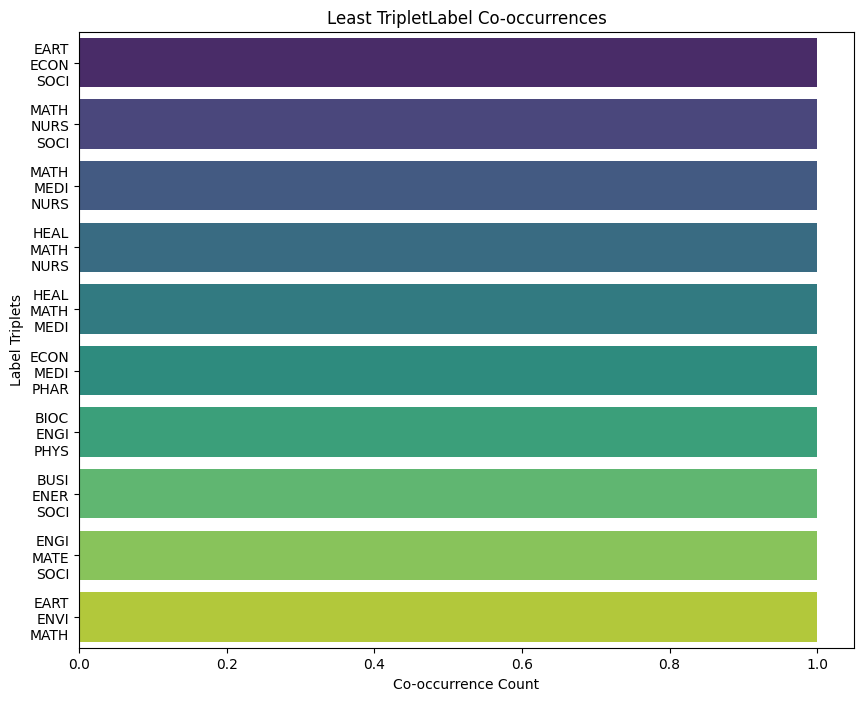

In [ ]:
triplet_co_occurrences = Counter()

for sublist in train_df['subjareas']:
    for triplet in itertools.combinations(sublist, 3):
        triplet_co_occurrences[triplet] += 1

sorted_triplets = triplet_co_occurrences.most_common()[::-1]

top_triplets = sorted_triplets[:10]
triplet_labels, triplet_counts = zip(*top_triplets)

x_triplet_labels = ['\n'.join(triplet) for triplet in triplet_labels]

df_top_triplets = pd.DataFrame({'triplet': x_triplet_labels, 'count': triplet_counts})

plt.figure(figsize=(10, 8))
sns.barplot(x='count', y='triplet', data=df_top_triplets, palette='viridis')
plt.title('Least TripletLabel Co-occurrences')
plt.xlabel('Co-occurrence Count')
plt.ylabel('Label Triplets')
plt.show()

In [ ]:
single_label_occurrences = Counter()

for sublist in train_df['subjareas']:
    if len(sublist) == 1:
        single_label_occurrences.update(sublist)

top_single_labels = single_label_occurrences.most_common()

top_single_labels


[('MULT', 3073),
 ('BIOC', 1678),
 ('MEDI', 1473),
 ('AGRI', 1294),
 ('NEUR', 1168),
 ('ENVI', 1118),
 ('PHAR', 835),
 ('EART', 718),
 ('MATE', 448),
 ('PHYS', 408),
 ('ENER', 358),
 ('SOCI', 294),
 ('COMP', 258),
 ('ENGI', 243),
 ('IMMU', 199),
 ('PSYC', 182),
 ('CHEM', 143),
 ('ECON', 141),
 ('BUSI', 101),
 ('CENG', 49),
 ('ARTS', 26),
 ('NURS', 17),
 ('VETE', 12),
 ('MATH', 9),
 ('HEAL', 5),
 ('DENT', 3),
 ('DECI', 1)]

<ipython-input-29-5650289698a1>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x='Single Occurrences', y='Label', data=df_top_single_labels, palette='viridis')


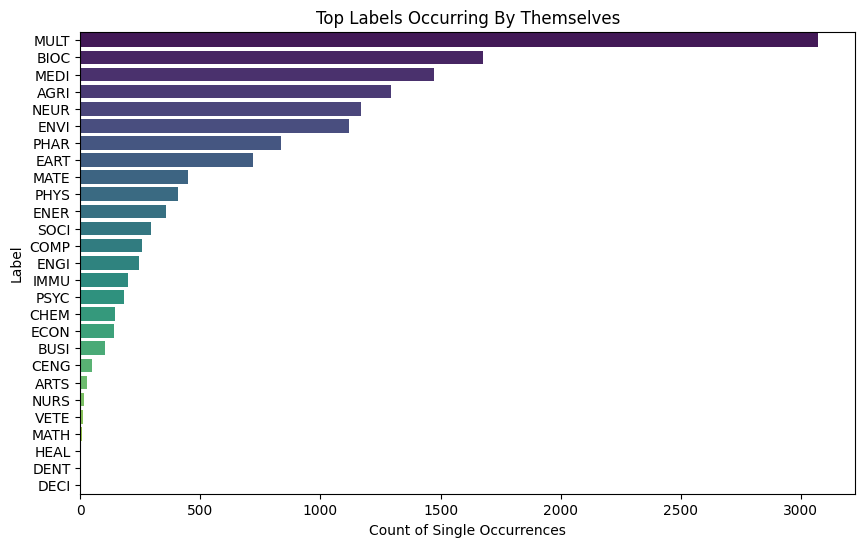

In [ ]:
df_top_single_labels = pd.DataFrame(top_single_labels, columns=['Label', 'Single Occurrences'])

# Creating a bar chart using Seaborn
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='Single Occurrences', y='Label', data=df_top_single_labels, palette='viridis')
plt.title('Top Labels Occurring By Themselves')
plt.xlabel('Count of Single Occurrences')
plt.ylabel('Label')
plt.show()

1.b. Frequency Distribution of ASJC codes


In [ ]:
asjc_to_description = {code: desc for codes, descs in zip(train_df['asjc'], train_df['asjc_descriptions']) for code, desc in zip(codes, descs)}

# Add a 'Description' column to your label_counts_df by mapping the 'ASJC Codes' through the dictionary created above
label_counts_df['Description'] = label_counts_df['ASJC Codes'].apply(lambda x: asjc_to_description.get(x, ''))

# Create the bar chart with Plotly Express
fig = px.bar(
    label_counts_df,
    x='ASJC Codes',
    y='Frequency',
    title='Frequency of ASJC Codes',
    hover_data=['Description']  # This will add the descriptions to the hover for each bar
)

# Show the figure
fig.show()


2. Distribution of abstract lengths

In [ ]:
abstract_lengths = train_df['abstract'].str.split().str.len()

max_length = abstract_lengths.max()
average_length = abstract_lengths.mean()
min_length = abstract_lengths.min()

max_length, average_length, min_length


(922, 205.555375405338, 0)

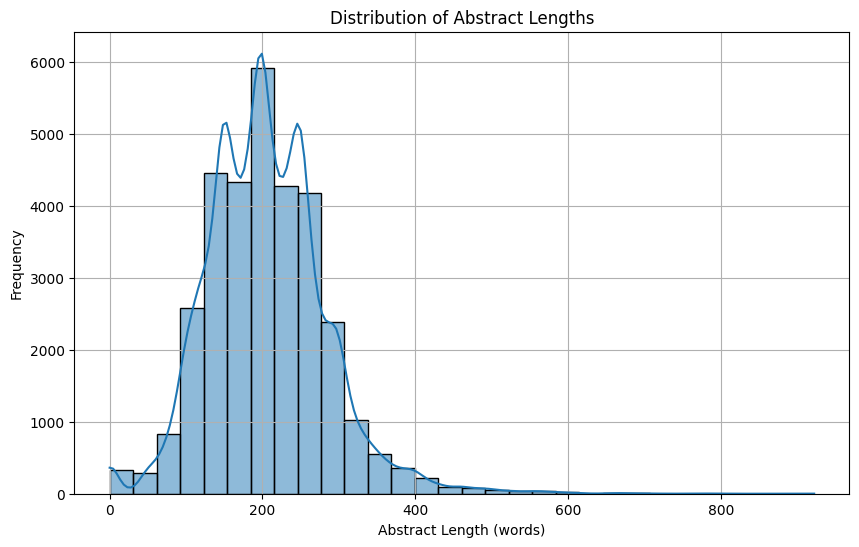

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(abstract_lengths, bins=30, kde=True)
plt.title('Distribution of Abstract Lengths')
plt.xlabel('Abstract Length (words)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

distribution of title lengths

In [ ]:
abstract_lengths = train_df['abstract'].str.split().str.len()

max_length = abstract_lengths.max()
average_length = abstract_lengths.mean()
min_length = abstract_lengths.min()

max_length, average_length, min_length

(922, 205.555375405338, 0)

2. Label Cardinality: Determine the average number of labels per sample.

 The code creates a histogram to visualize the distribution of the number of subject area labels per article in the dataset. It calculates the average number of labels per article (label cardinality) and adds a dashed line to the histogram at the average value. Additionally, it annotates the plot with the mean label count for easy reference. This visualization helps in understanding the label distribution for multi-label classification tasks.

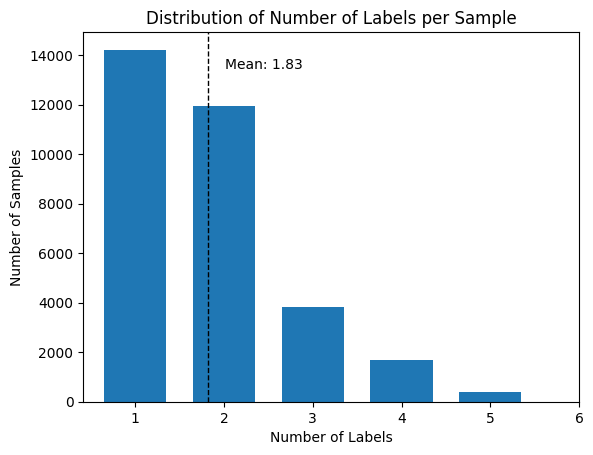

In [ ]:
train_df['label_count'] = train_df['subjareas'].apply(lambda labels: len(labels))
label_cardinality = train_df['label_count'].mean()
train_df['label_count'].plot(kind='hist', bins=range(1, train_df['label_count'].max()+1), align='left', rwidth=0.7)
plt.title('Distribution of Number of Labels per Sample')
plt.xlabel('Number of Labels')
plt.ylabel('Number of Samples')
plt.xticks(range(1, train_df['label_count'].max()+1))
plt.axvline(label_cardinality, color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(label_cardinality*1.1, max_ylim*0.9, f'Mean: {label_cardinality:.2f}')
plt.show()

3. Text Length Analysis: Calculate the number of words in the title, abstract, and body text. Plot histograms to visualize the distribution of text lengths.

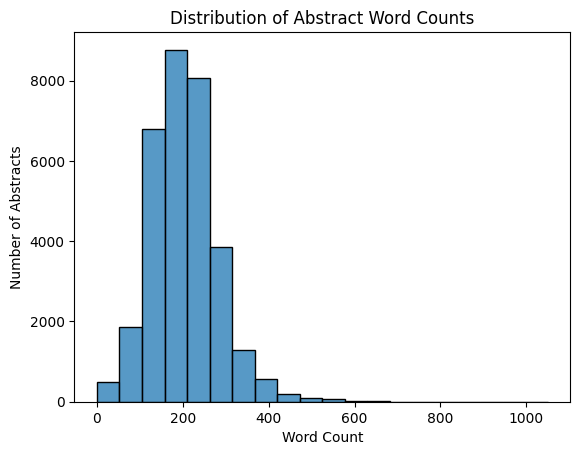

In [ ]:
train_df['word_count'] = train_df['abstract'].apply(lambda x: len(x.split()))
sns.histplot(train_df['word_count'], bins=20, kde=False)
plt.title('Distribution of Abstract Word Counts')
plt.xlabel('Word Count')
plt.ylabel('Number of Abstracts')
plt.show()

4a. Word Frequency Analysis: Identify the most frequent words and terms in the dataset overall and within each subject area.



<ipython-input-20-4159faf4efc4>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




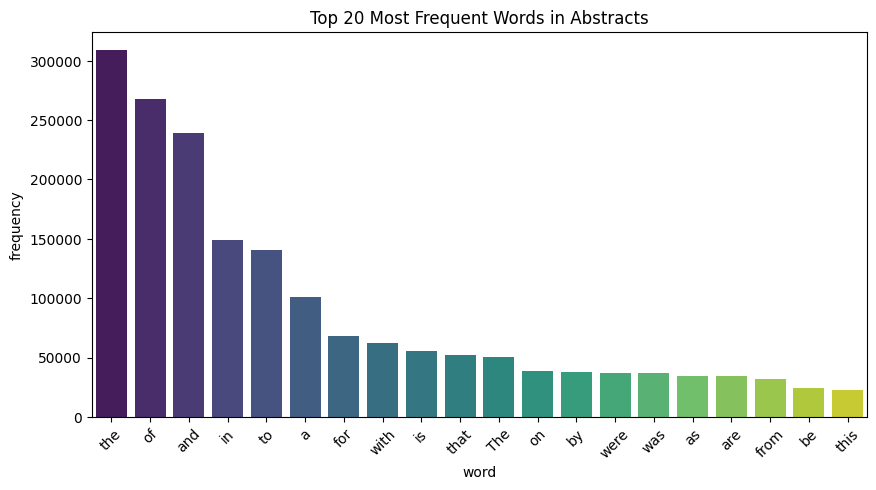

In [ ]:
word_freq = Counter(" ".join(train_df["abstract"]).split()).most_common()

word_freq_df = pd.DataFrame(word_freq, columns=['word', 'frequency'])

plt.figure(figsize=(10, 5))
sns.barplot(x='word', y='frequency', data=word_freq_df.head(20), palette='viridis')
plt.title('Top 20 Most Frequent Words in Abstracts')
plt.xticks(rotation=45)
plt.show()


4b. Lets remove stop words and plot

<ipython-input-23-f4283bd87aa3>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




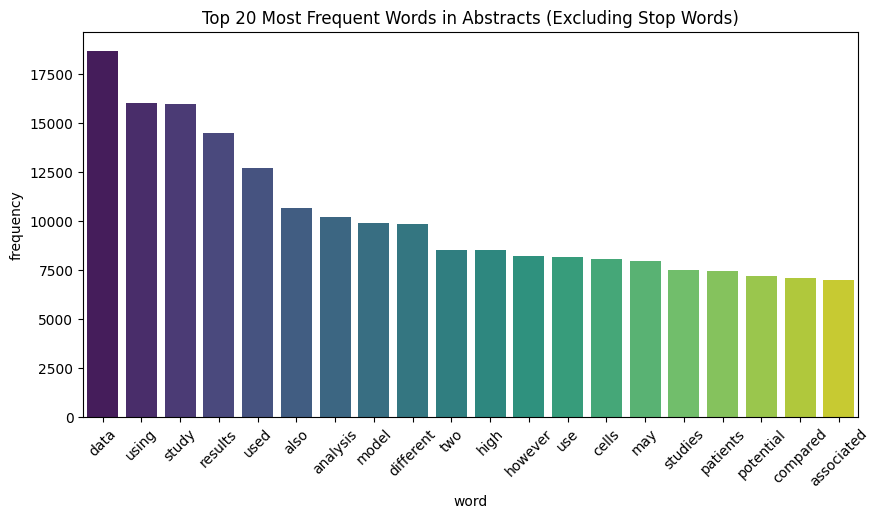

In [ ]:
stop_words = set(stopwords.words('english'))
train_df['tokens'] = train_df['abstract'].apply(lambda text: [word for word in word_tokenize(text.lower()) if word.isalpha() and word not in stop_words])

word_freq = Counter([word for tokens in train_df['tokens'] for word in tokens]).most_common()

word_freq_df = pd.DataFrame(word_freq, columns=['word', 'frequency'])

plt.figure(figsize=(10, 5))
sns.barplot(x='word', y='frequency', data=word_freq_df.head(20), palette='viridis')
plt.title('Top 20 Most Frequent Words in Abstracts (Excluding Stop Words)')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Tokenizing the abstracts and counting the word occurrences
abstracts = train_df['abstract'].tolist()

word_counts = Counter(word for abstract in abstracts for word in abstract.split())

# Extracting words and their counts to plot
words, counts = zip(*word_counts.most_common())

# Plotting the word frequency distribution
plt.figure(figsize=(14, 7))
plt.bar(words, counts)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Frequency Distribution of Words in Abstracts')
plt.xticks(rotation=90)  # Rotate x labels for better readability
plt.show()

5a. N-Gram Analysis: Explore common bigrams and trigrams to understand the context better


<ipython-input-21-01e9b5955431>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




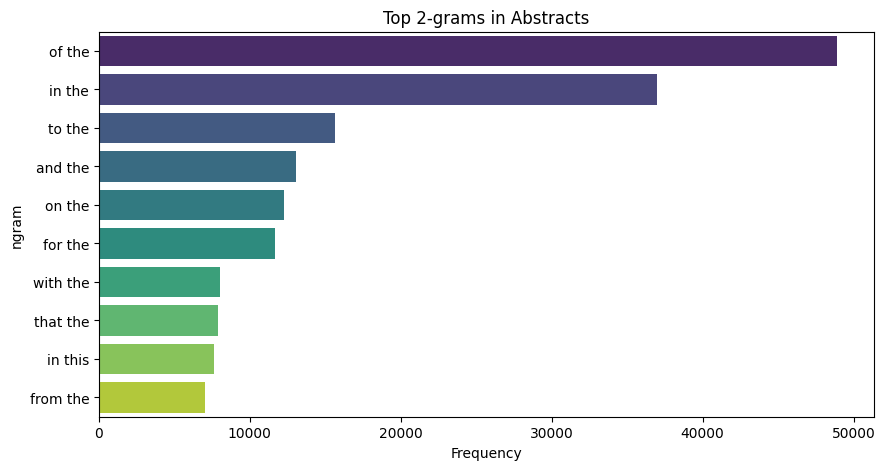

<ipython-input-21-01e9b5955431>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




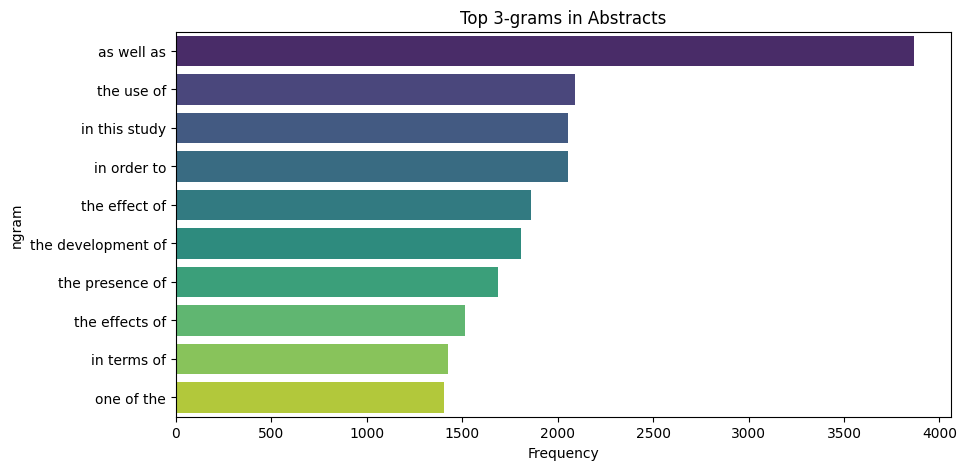

In [ ]:
def plot_top_ngrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    top_words_freq = words_freq[:10]
    top_ngrams = pd.DataFrame(top_words_freq, columns=['ngram', 'frequency'])
    # Plot
    sns.barplot(x='frequency', y='ngram', data=top_ngrams, palette='viridis')
    plt.title(f'Top {n}-grams in Abstracts')
    plt.xlabel('Frequency')

# Plot the top bigrams
plt.figure(figsize=(10, 5))
plot_top_ngrams(train_df['abstract'], 2)
plt.show()

# Plot the top trigrams
plt.figure(figsize=(10, 5))
plot_top_ngrams(train_df['abstract'], 3)
plt.show()


5b. Lets Remove stop words

<ipython-input-31-d8fdf15d1736>:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




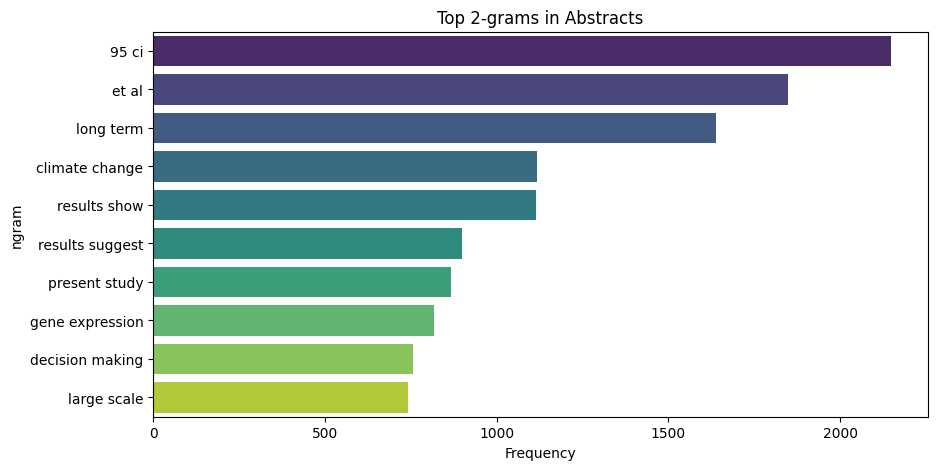

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



stop_words = set(stopwords.words('english'))

def plot_top_ngrams(corpus, n=None):
    try:
        vec = CountVectorizer(ngram_range=(n, n), stop_words=list(stop_words)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0)
        words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
        top_words_freq = words_freq[:10]
        top_ngrams = pd.DataFrame(top_words_freq, columns=['ngram', 'frequency'])

        plt.figure(figsize=(10, 5))
        sns.barplot(x='frequency', y='ngram', data=top_ngrams, palette='viridis')
        plt.title(f'Top {n}-grams in Abstracts')
        plt.xlabel('Frequency')
    except ValueError as e:
        print(f"Cannot plot top {n}-grams due to ValueError: {e}")


corpus = train_df['abstract'].tolist()

plot_top_ngrams(corpus, 2)

<ipython-input-31-d8fdf15d1736>:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




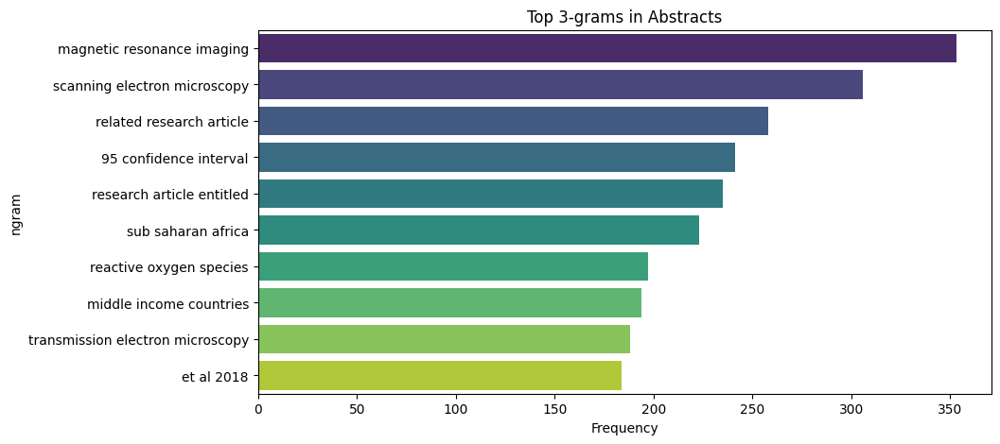

In [ ]:
plot_top_ngrams(corpus, 3)

6. Word Cloud Generation

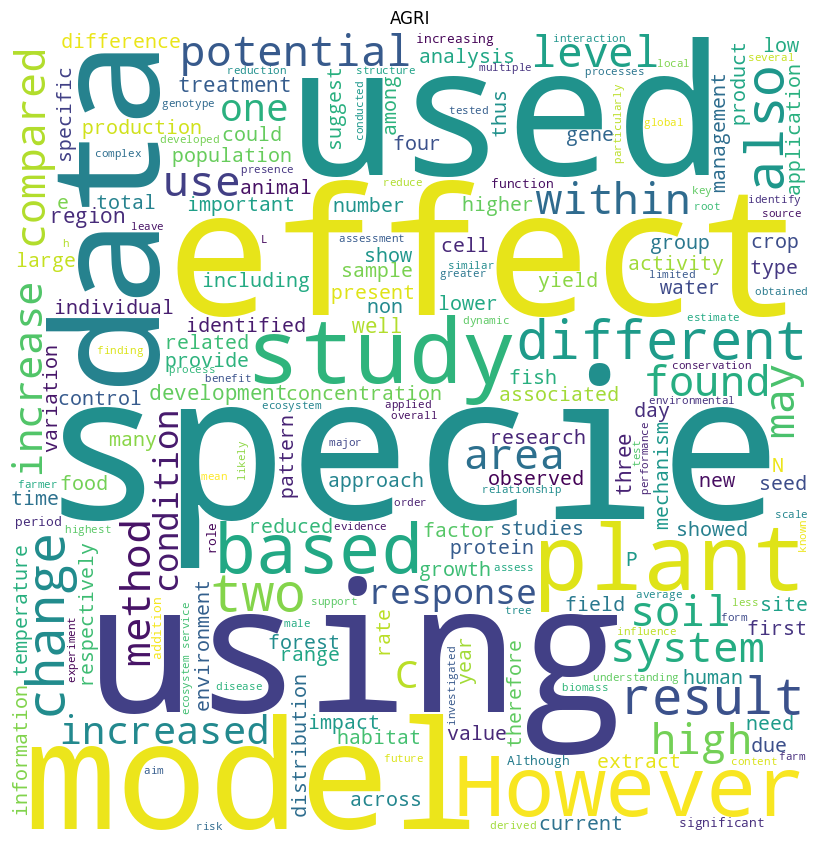

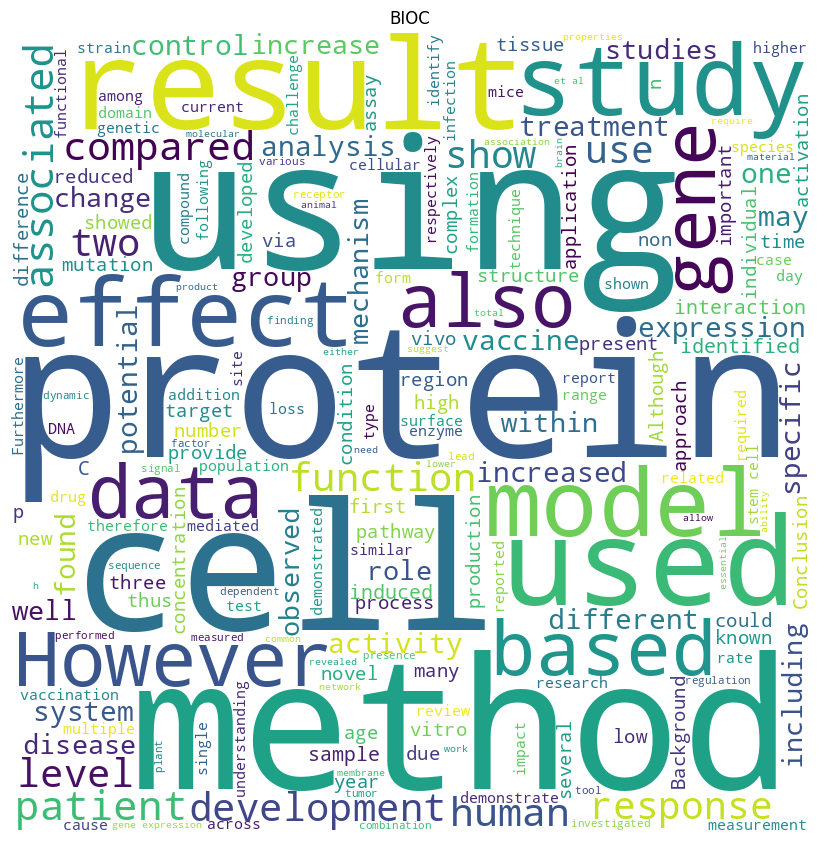

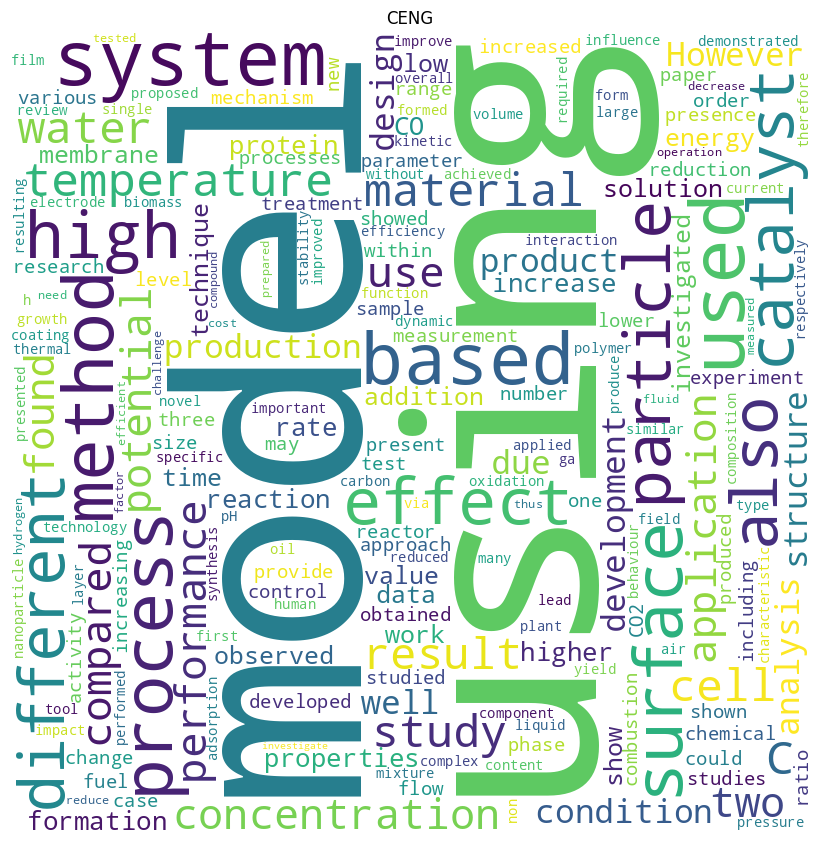

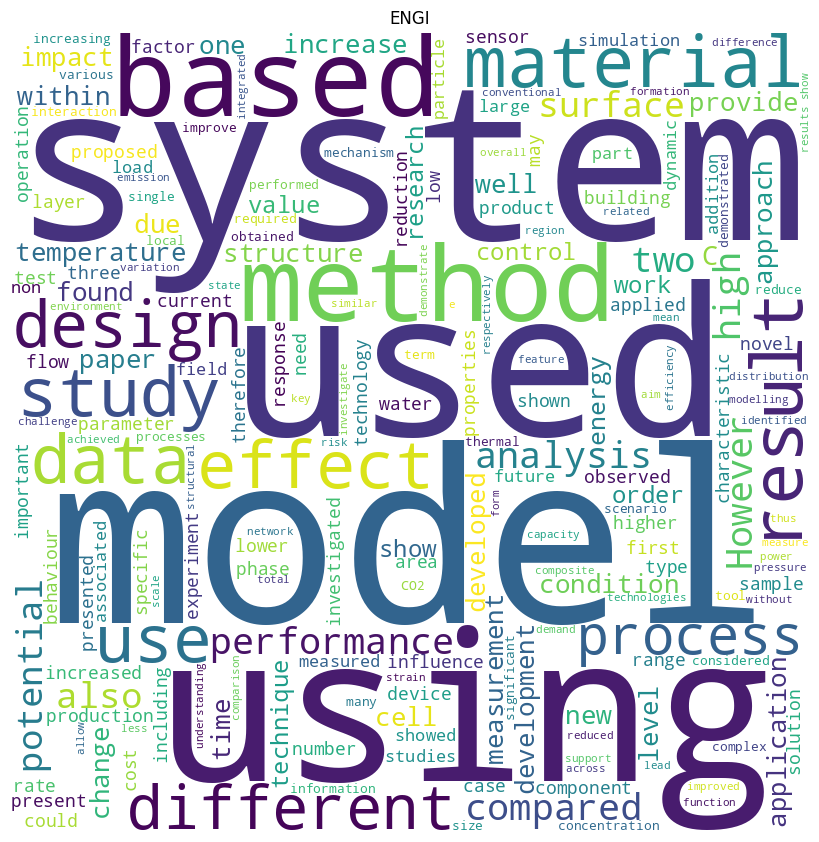

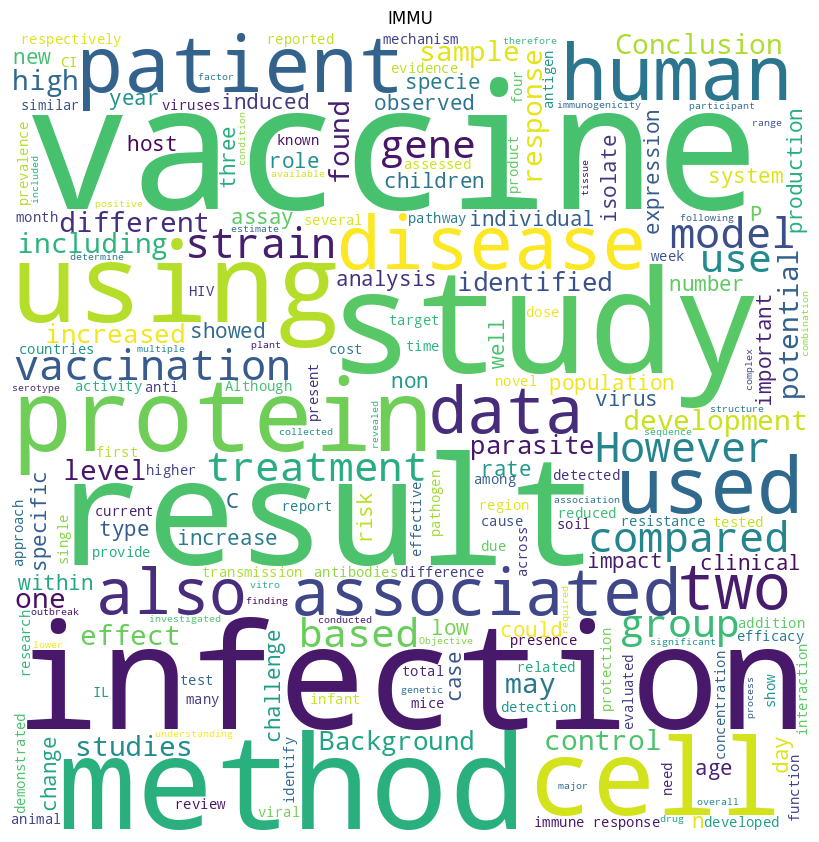

...

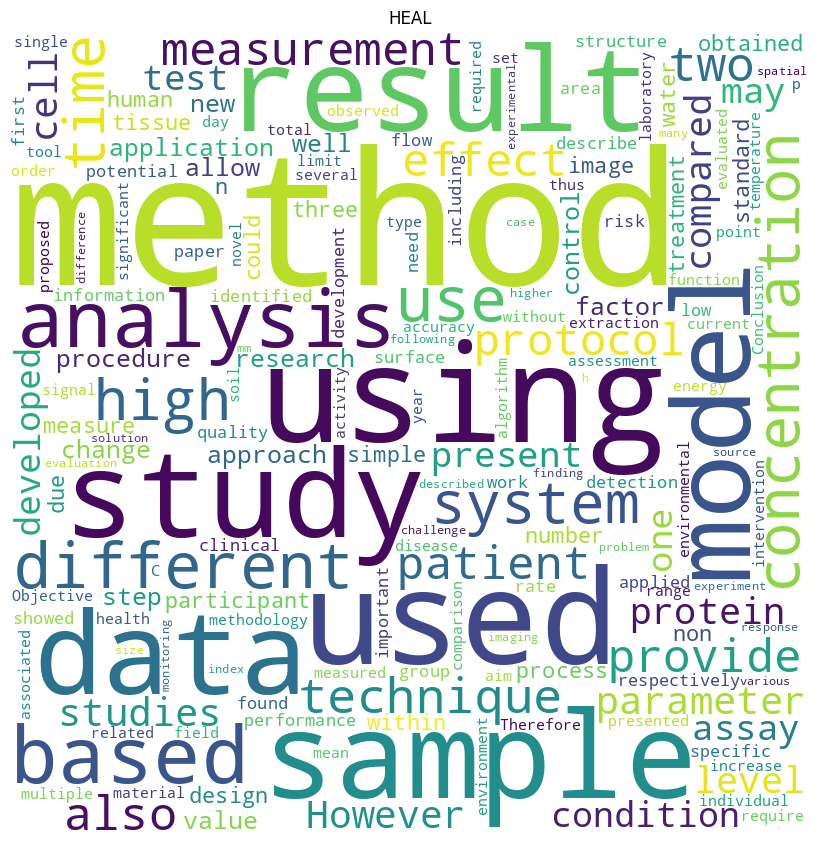

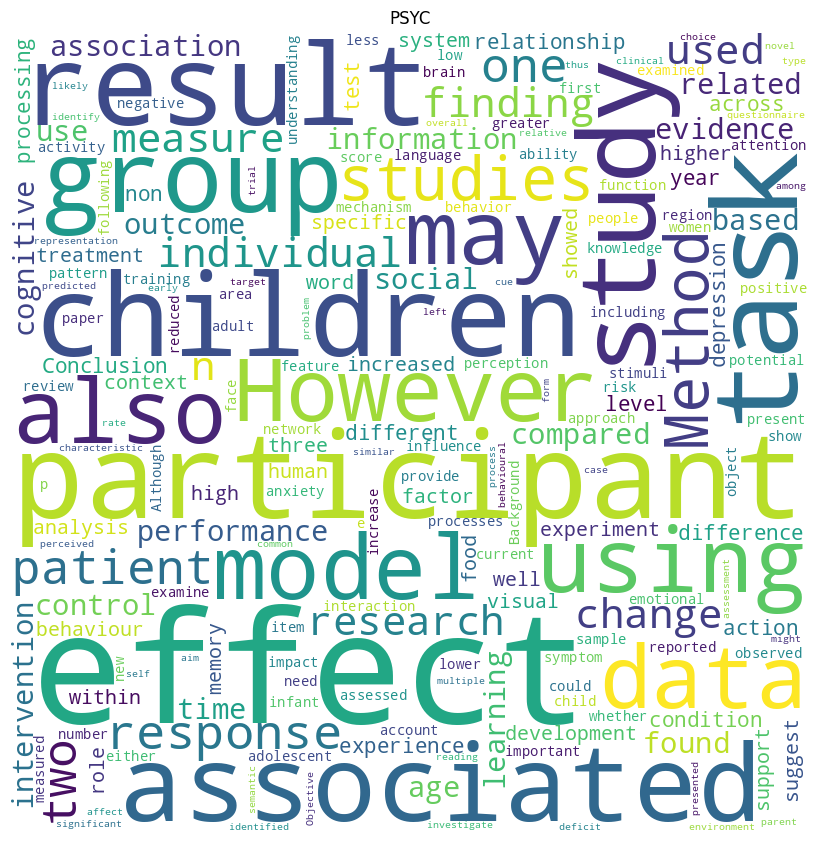

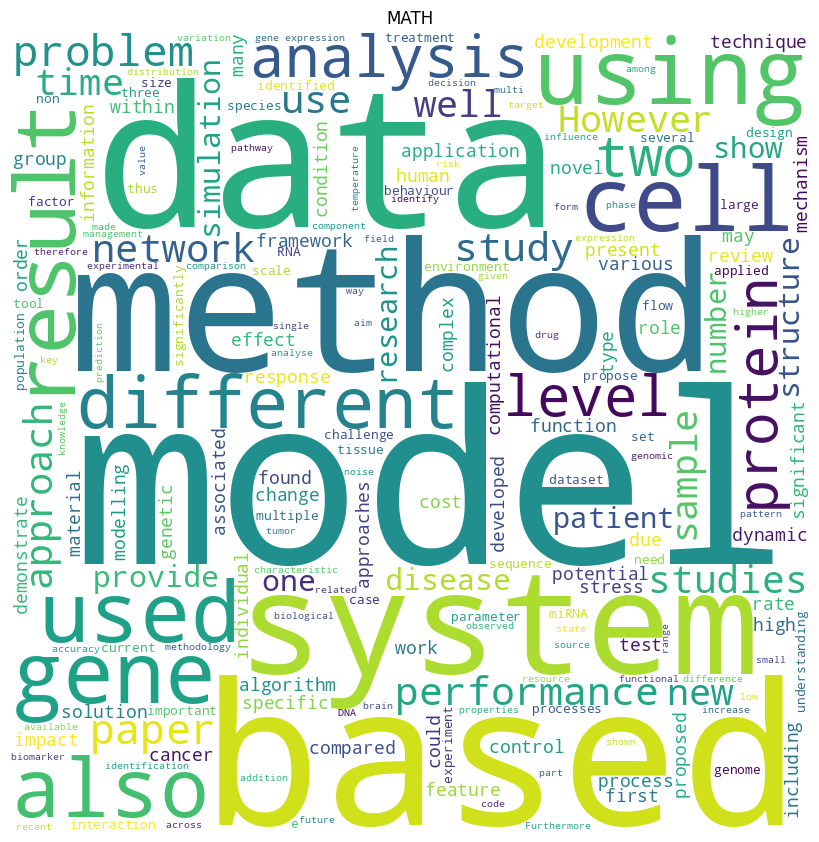

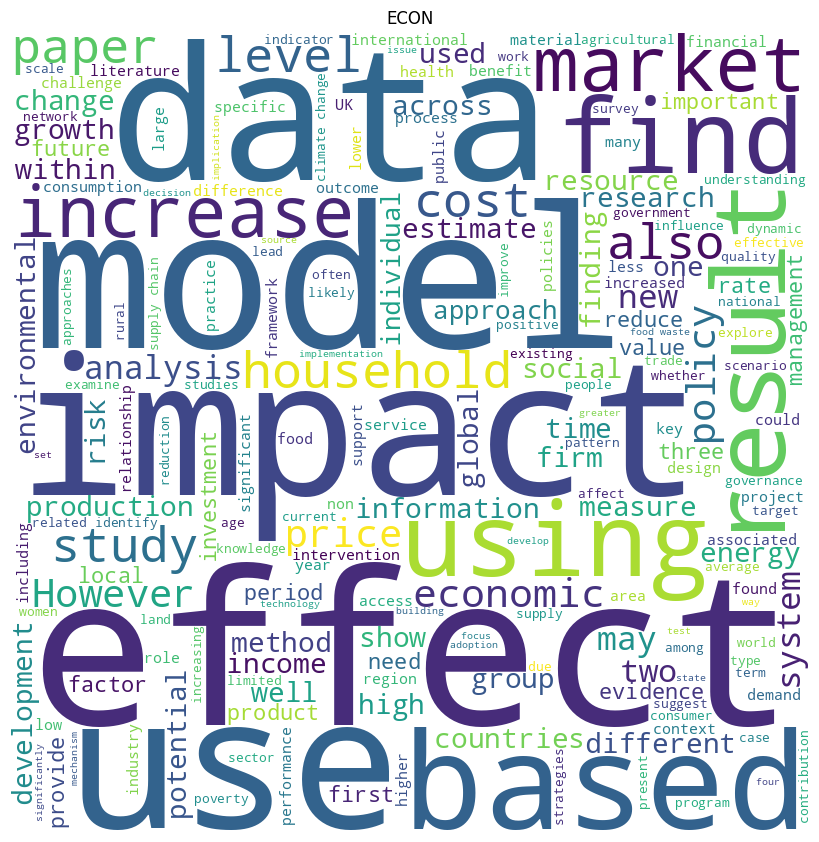

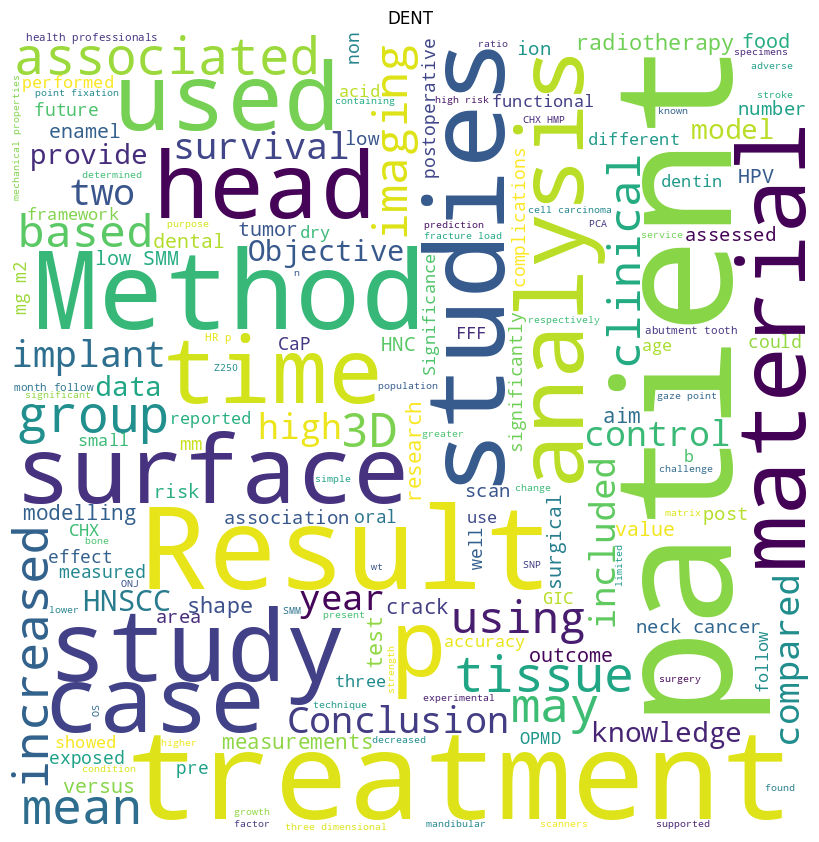

In [ ]:
subj_area_abstracts = {}
for index, row in train_df.iterrows():
    for area in row['subjareas']:
        if area not in subj_area_abstracts:
            subj_area_abstracts[area] = ''
        subj_area_abstracts[area] += ' ' + row['abstract']

for area, texts in subj_area_abstracts.items():
    wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stop_words,
                min_font_size = 10).generate(texts)

    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.title(area)
    plt.show()


<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




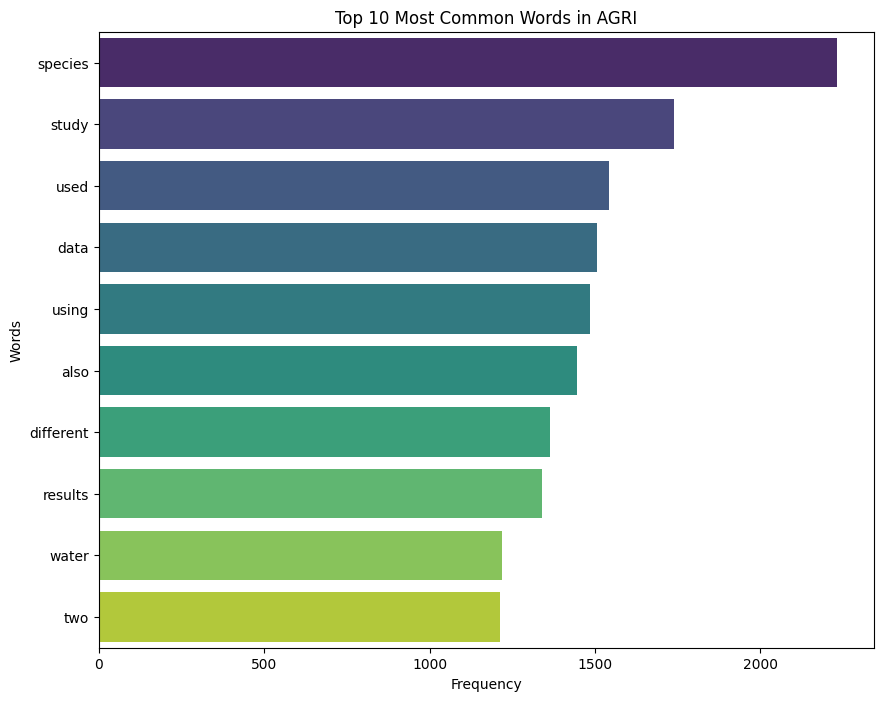

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




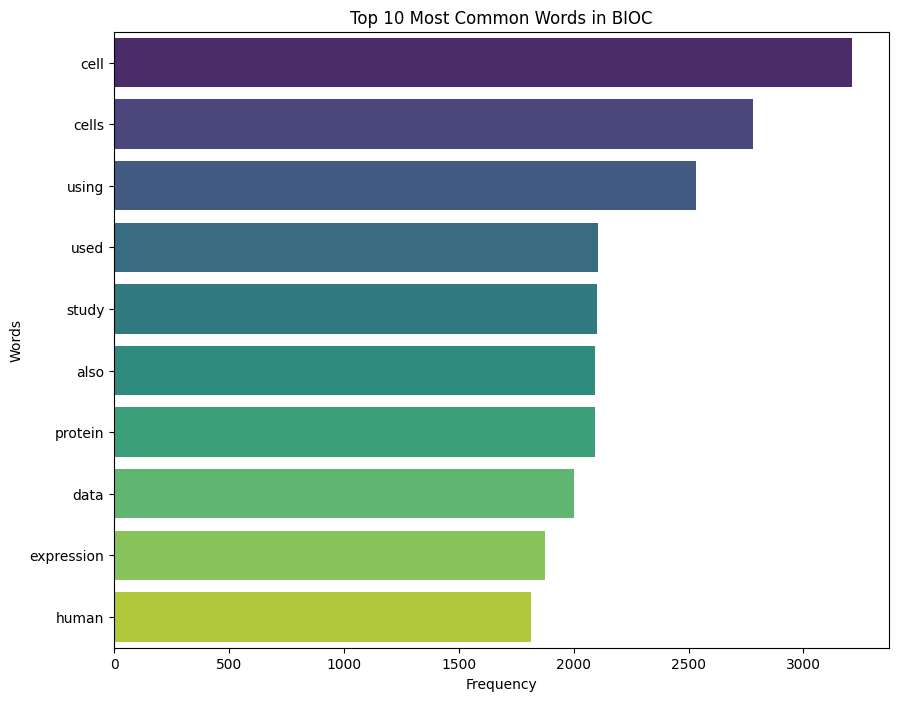

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




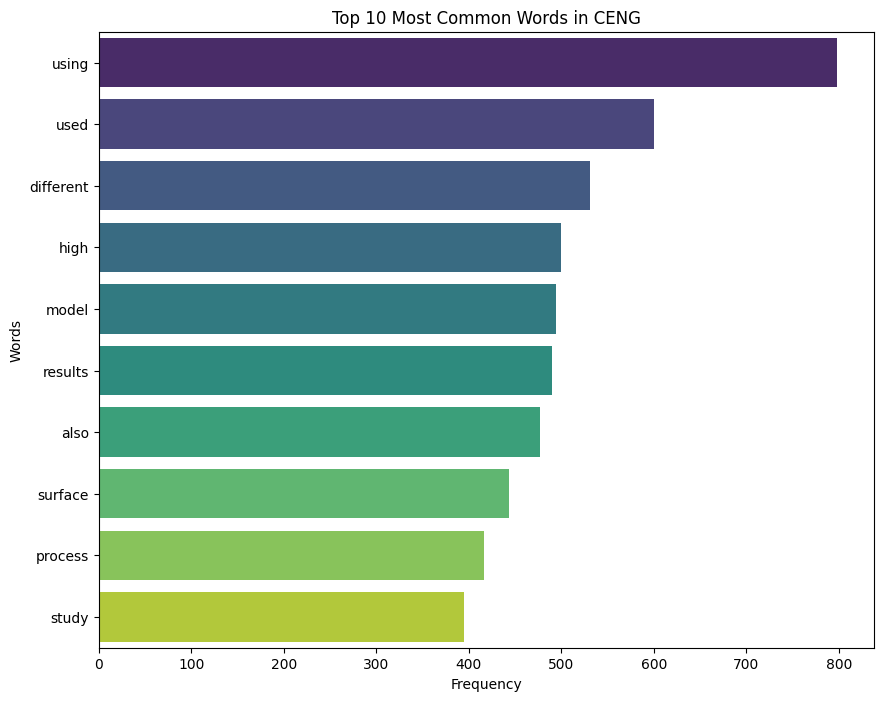

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




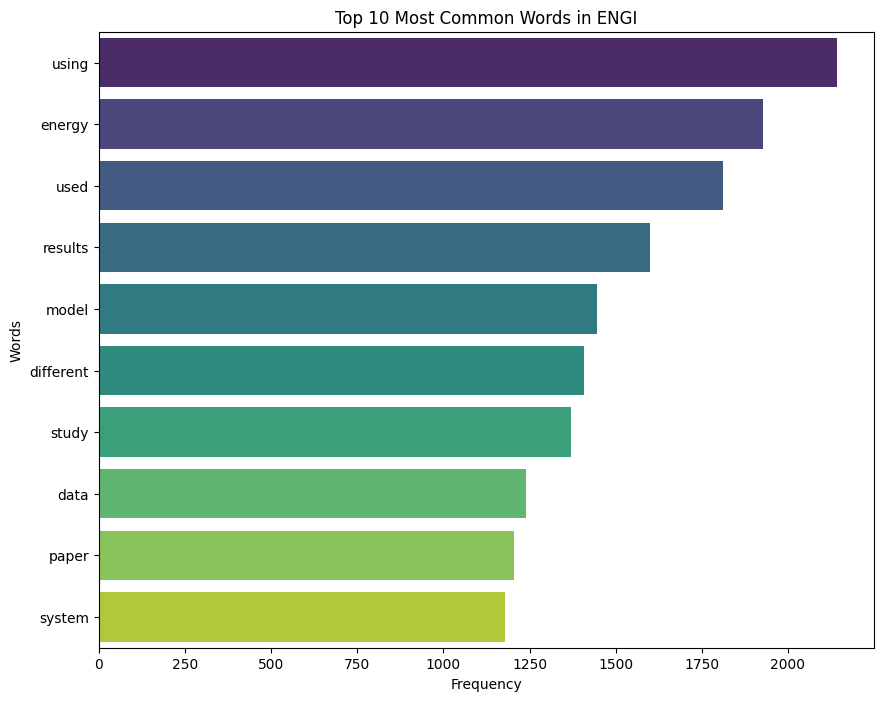

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




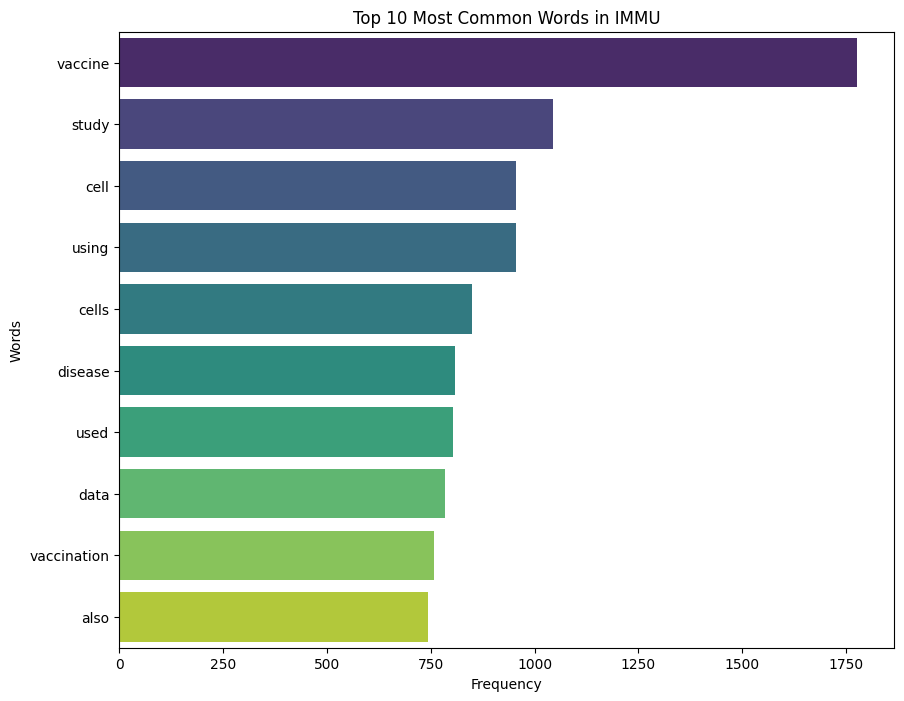

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




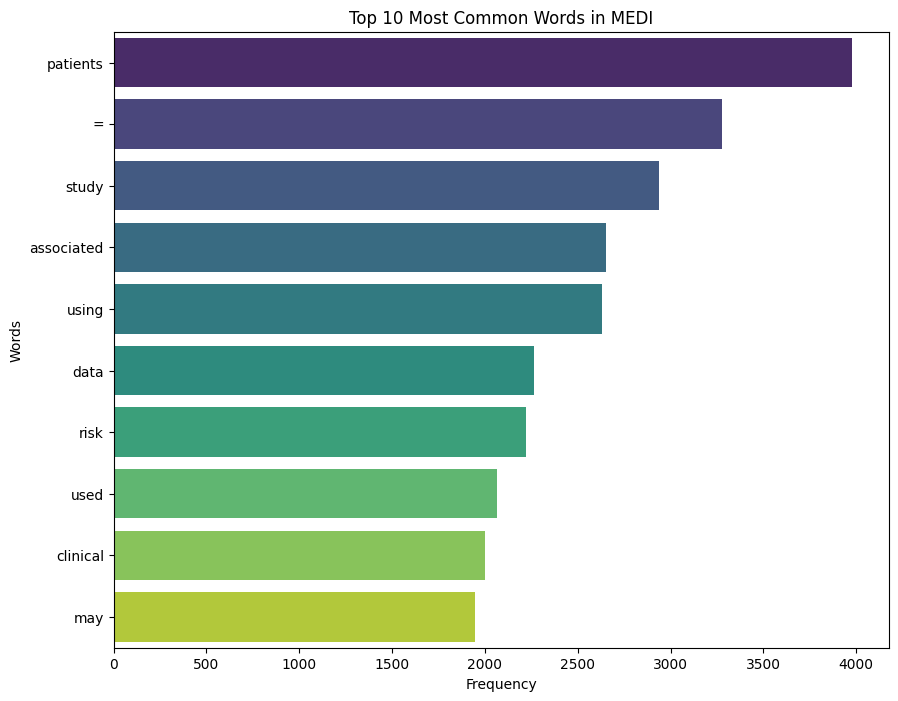

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




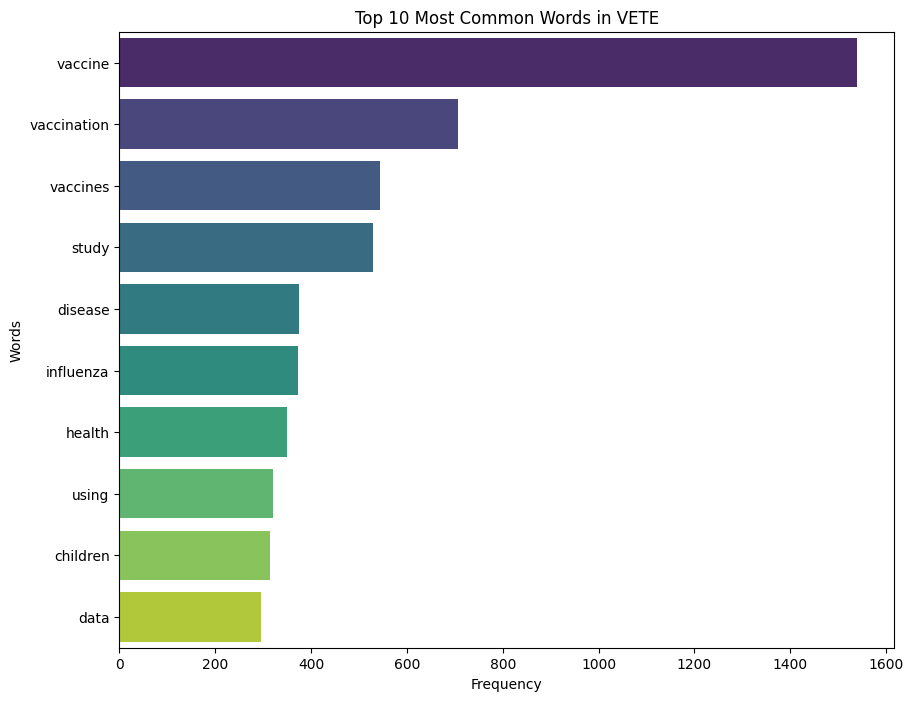

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




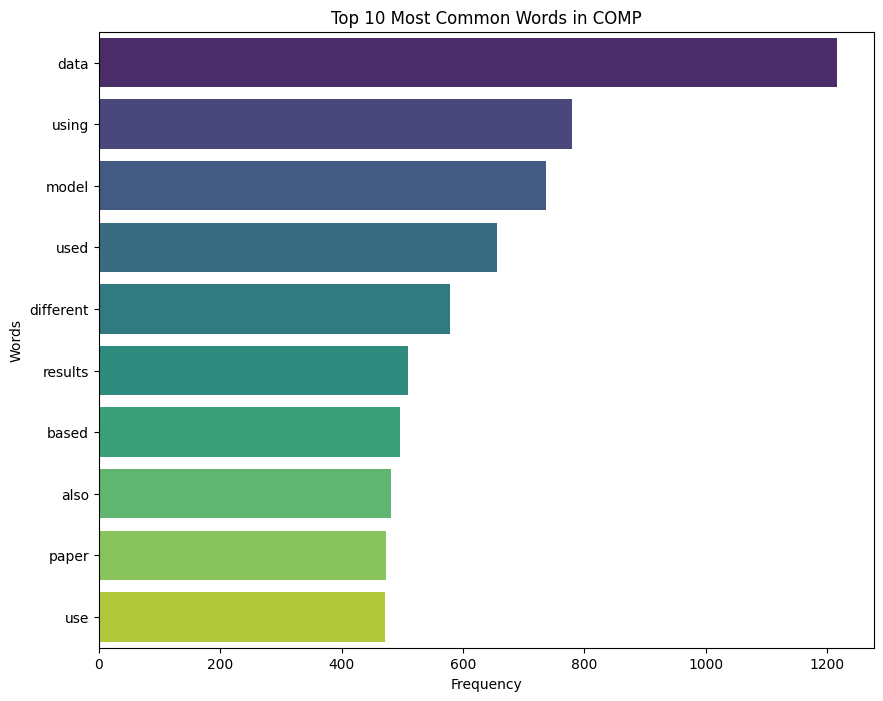

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




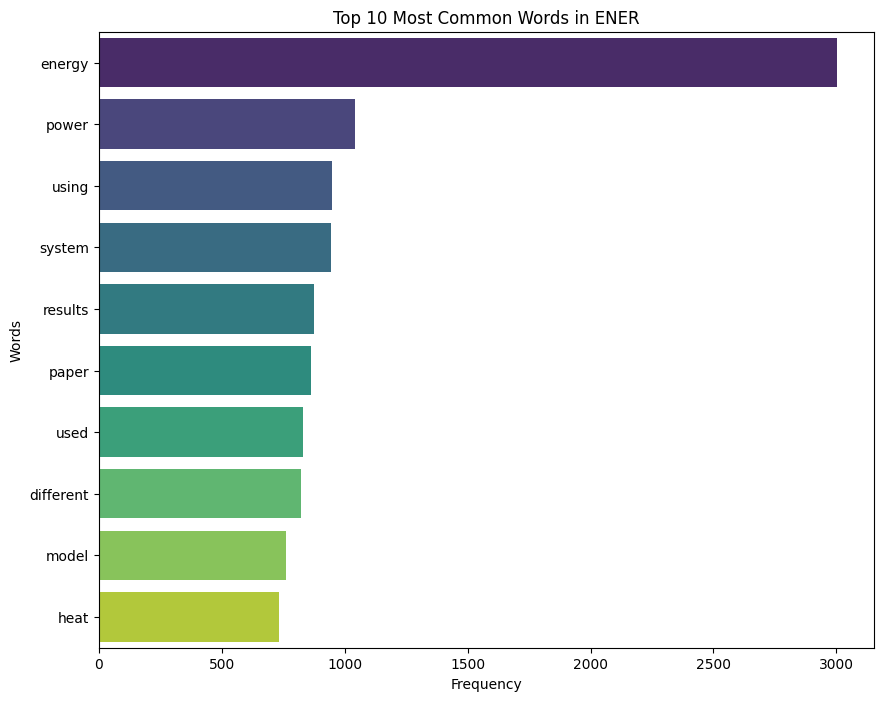

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




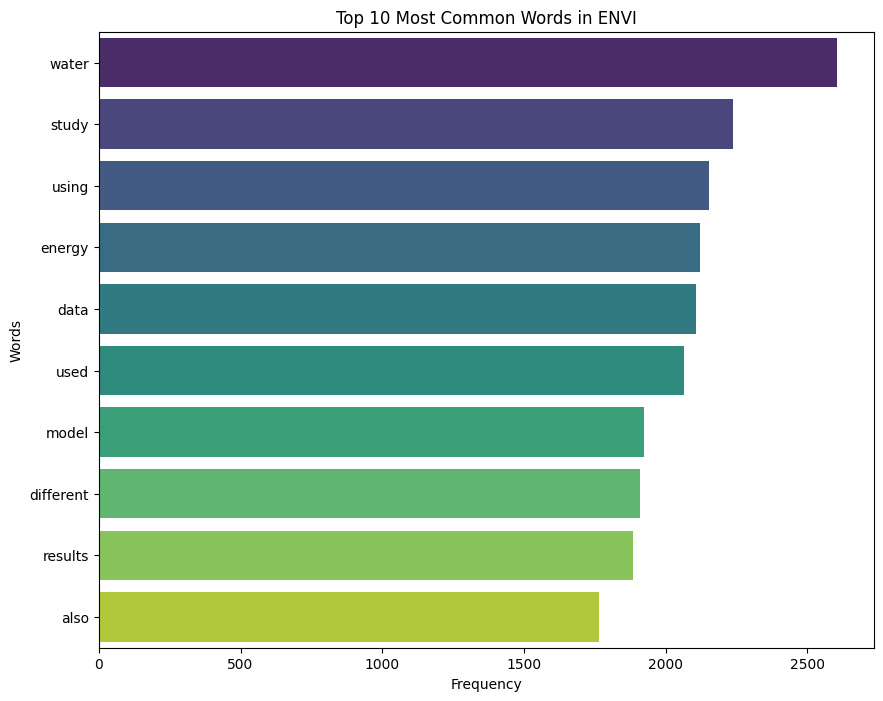

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




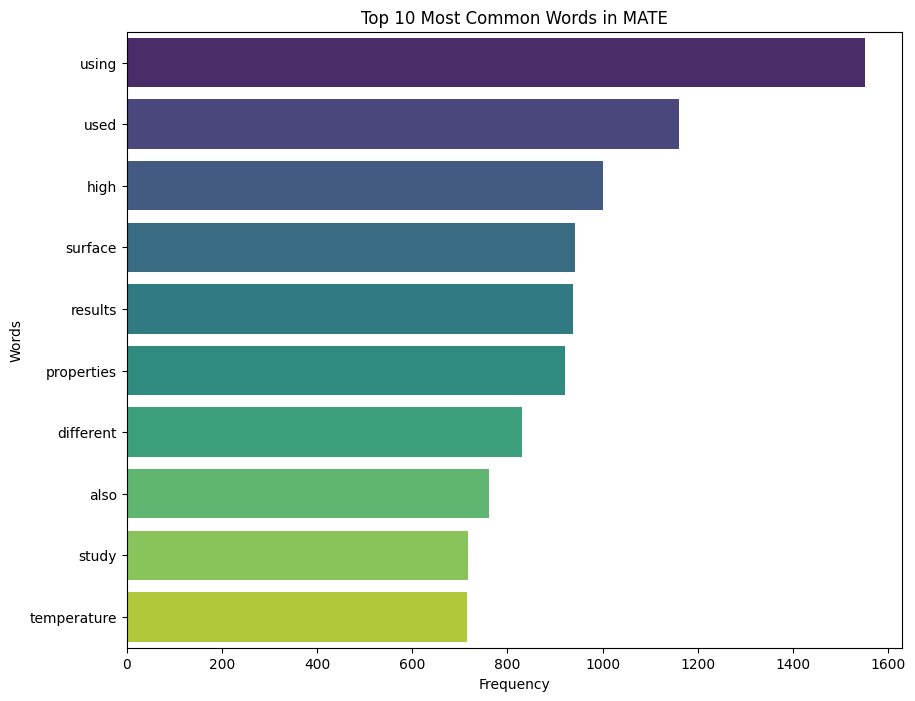

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




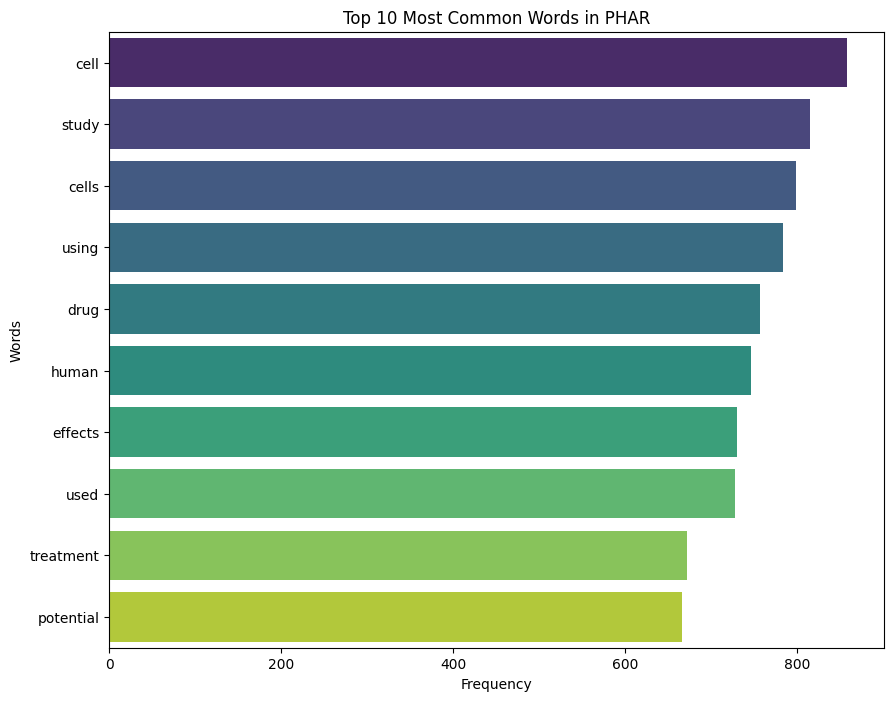

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




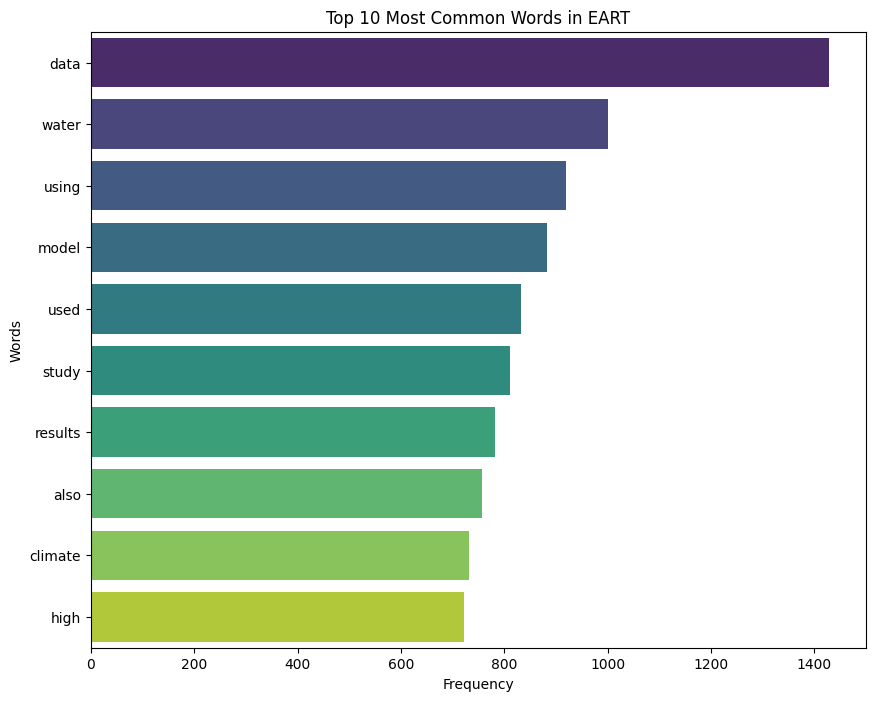

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




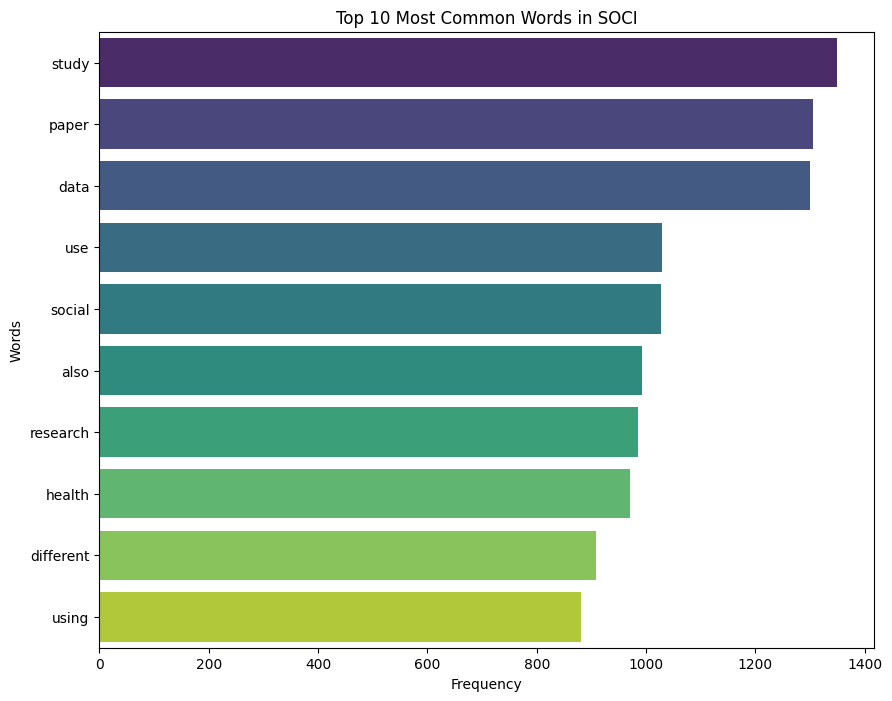

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




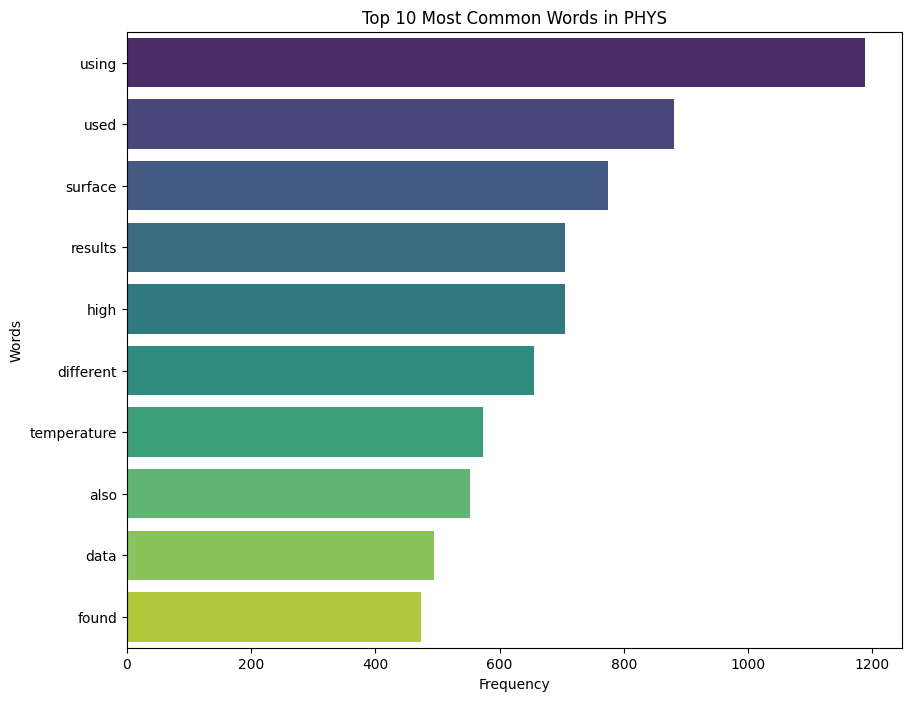

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




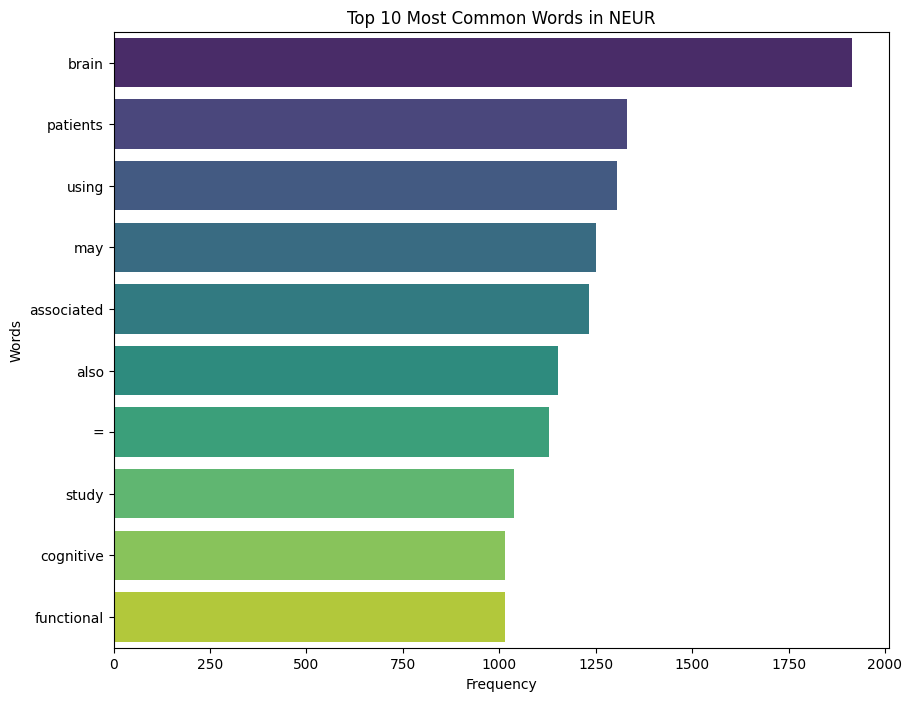

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




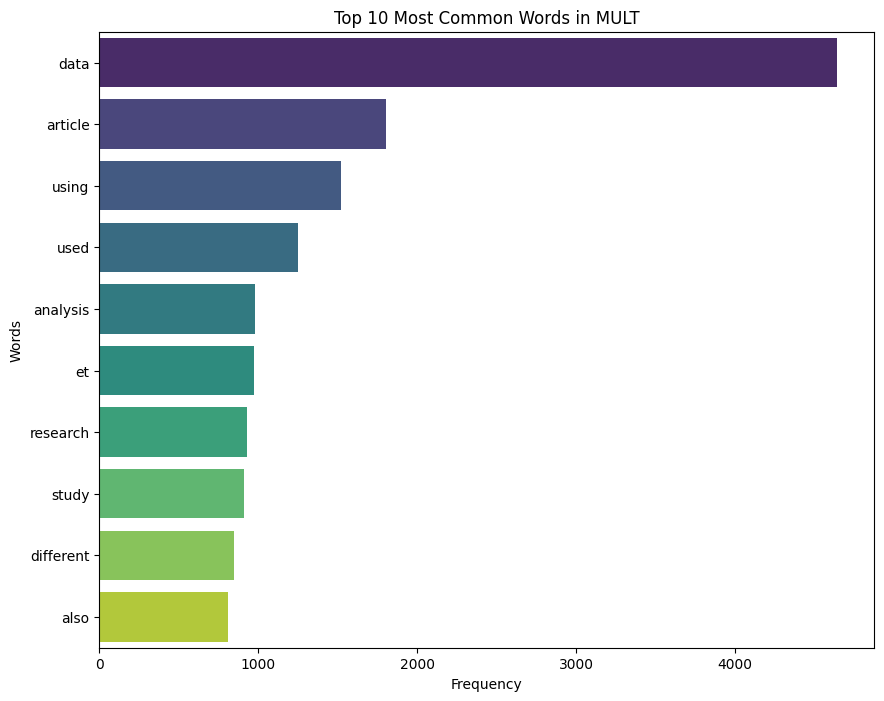

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




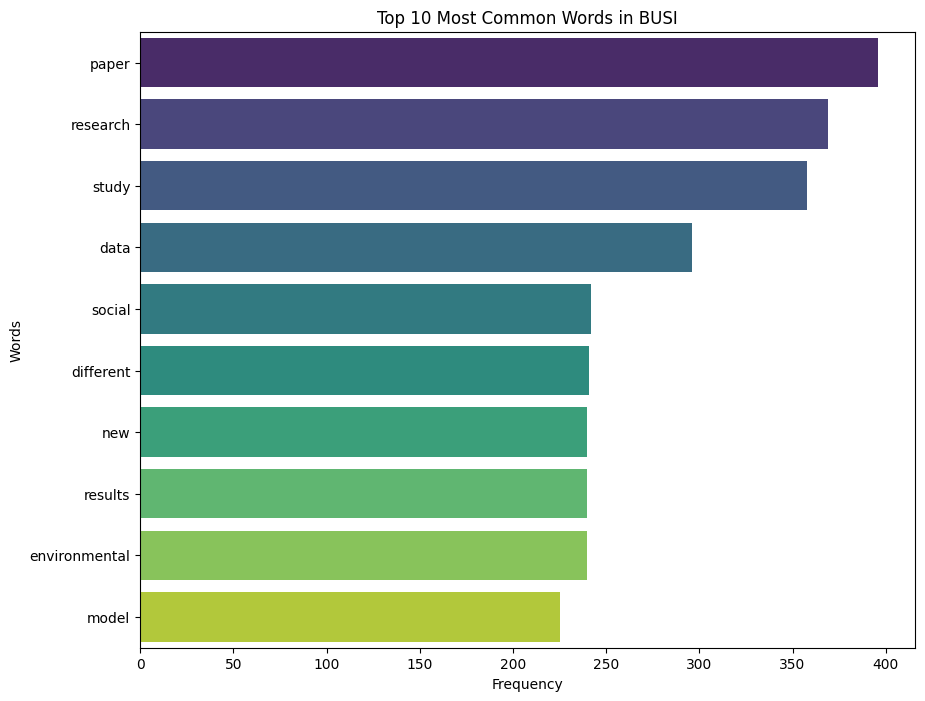

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




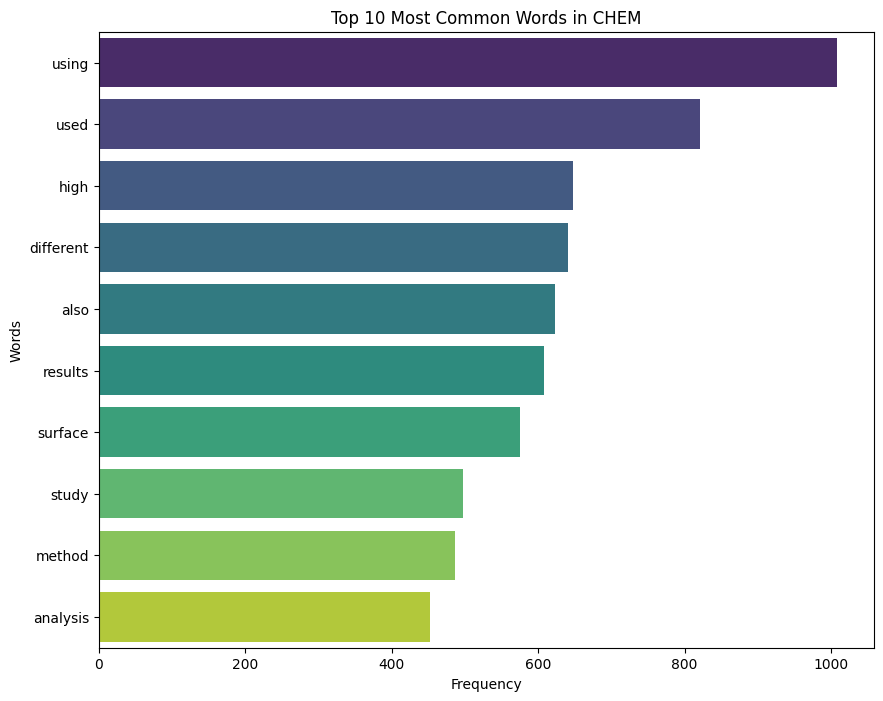

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




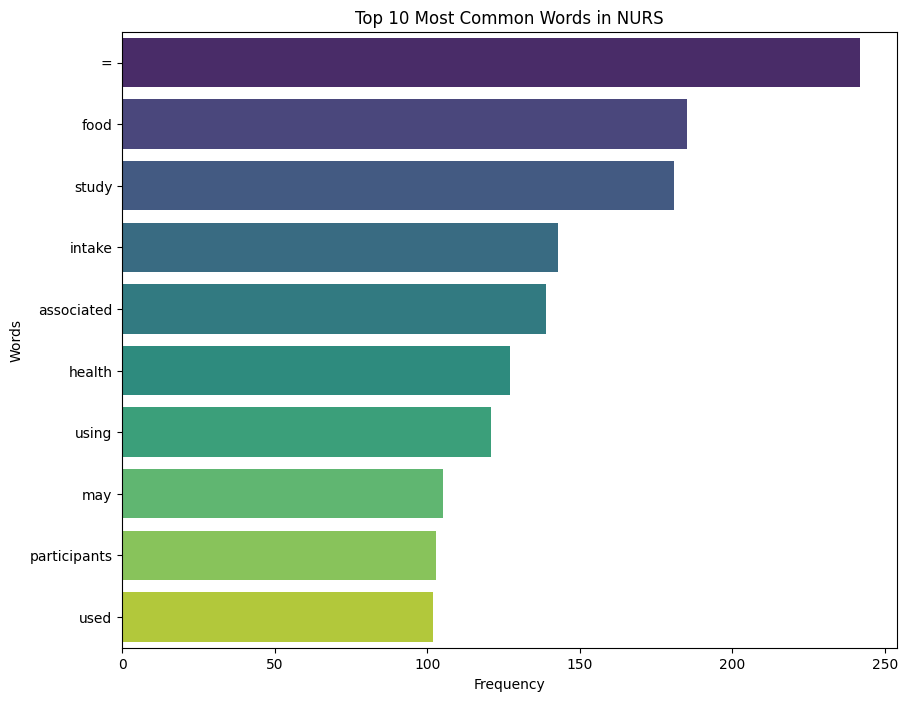

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




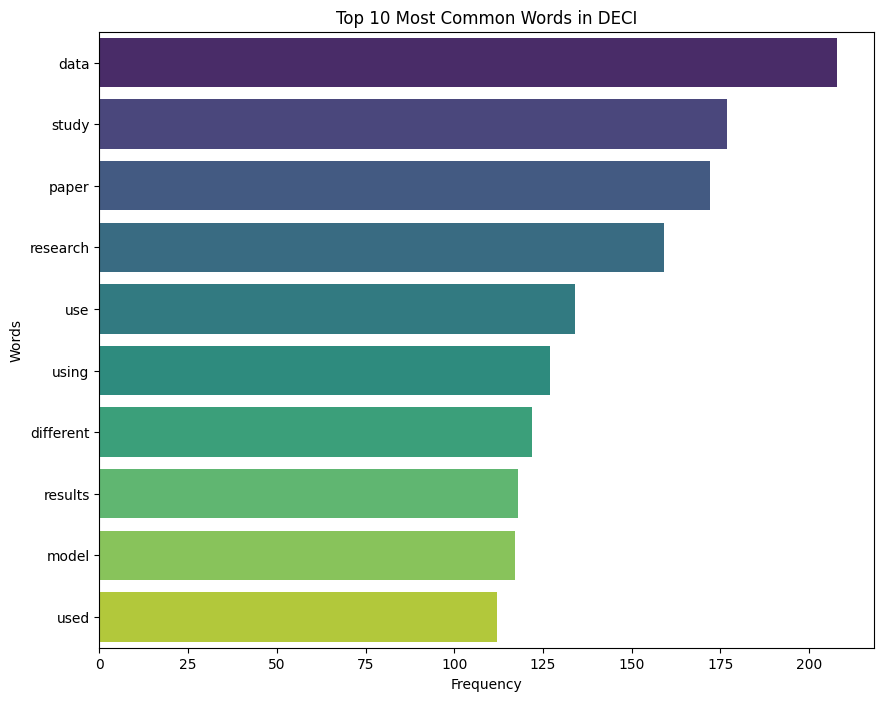

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




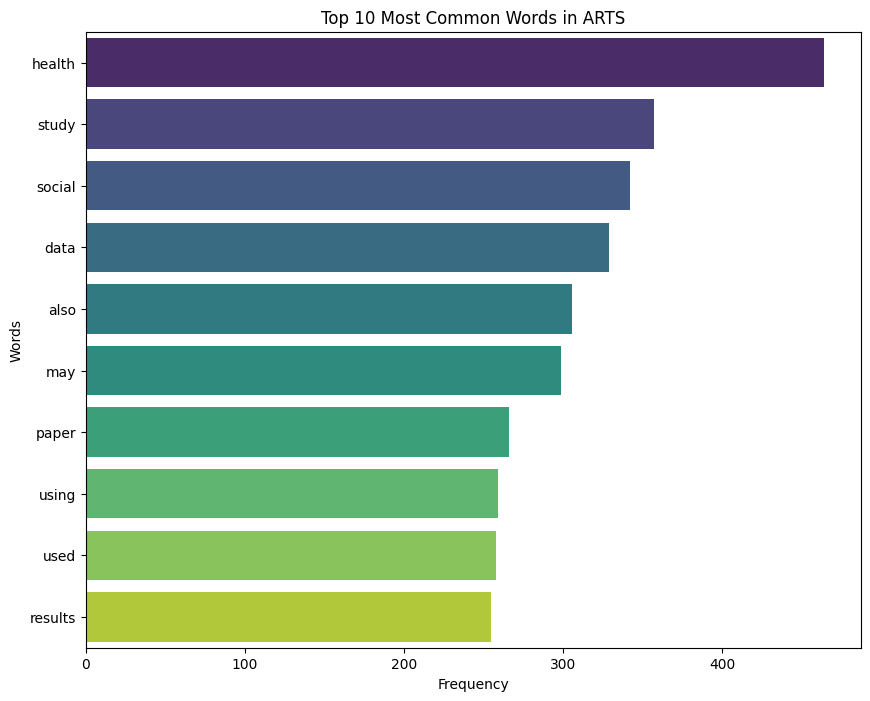

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




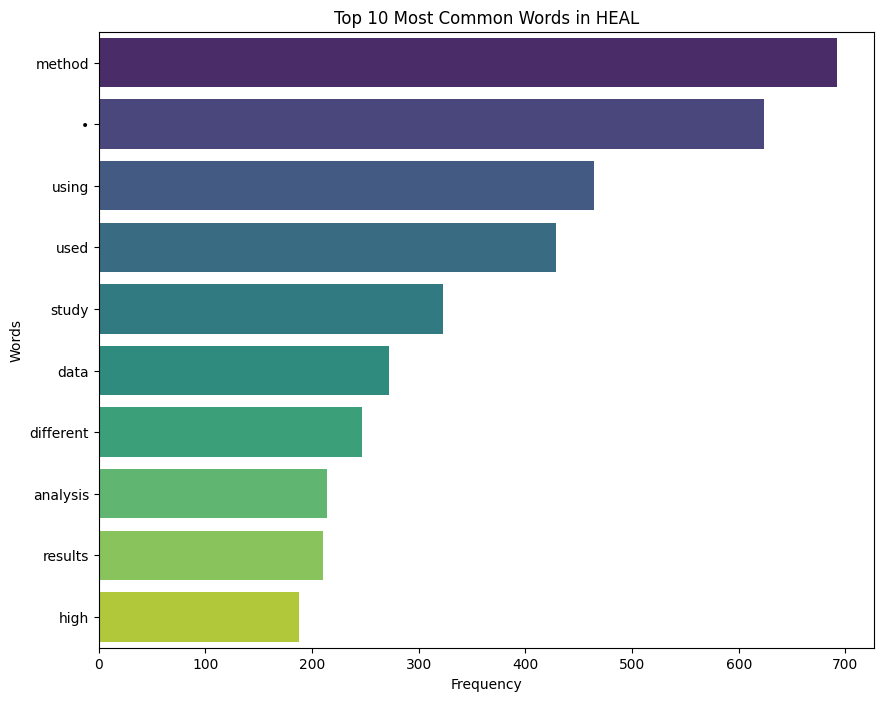

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




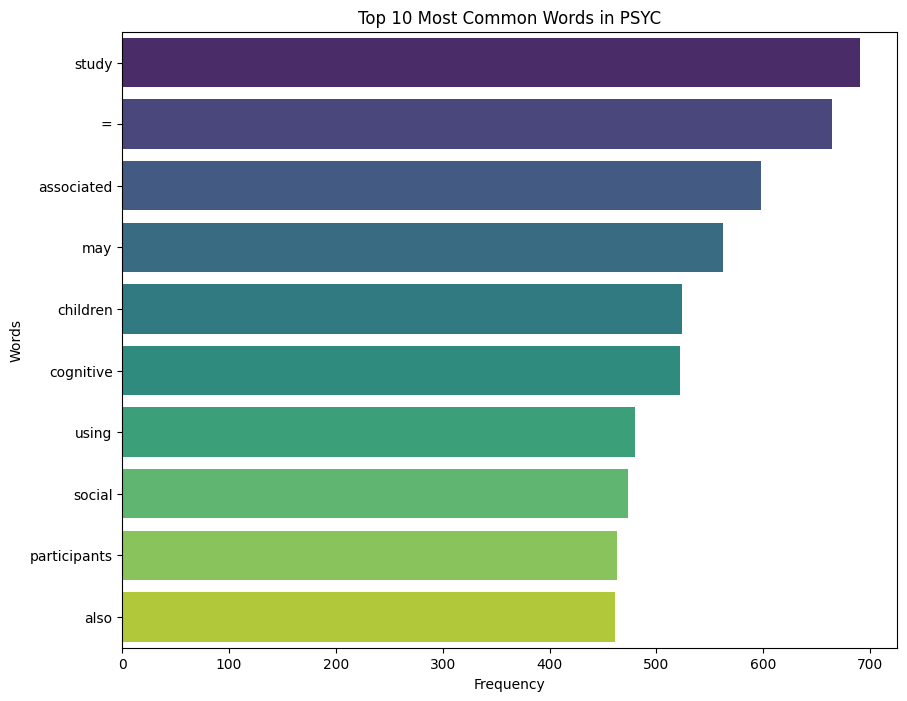

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




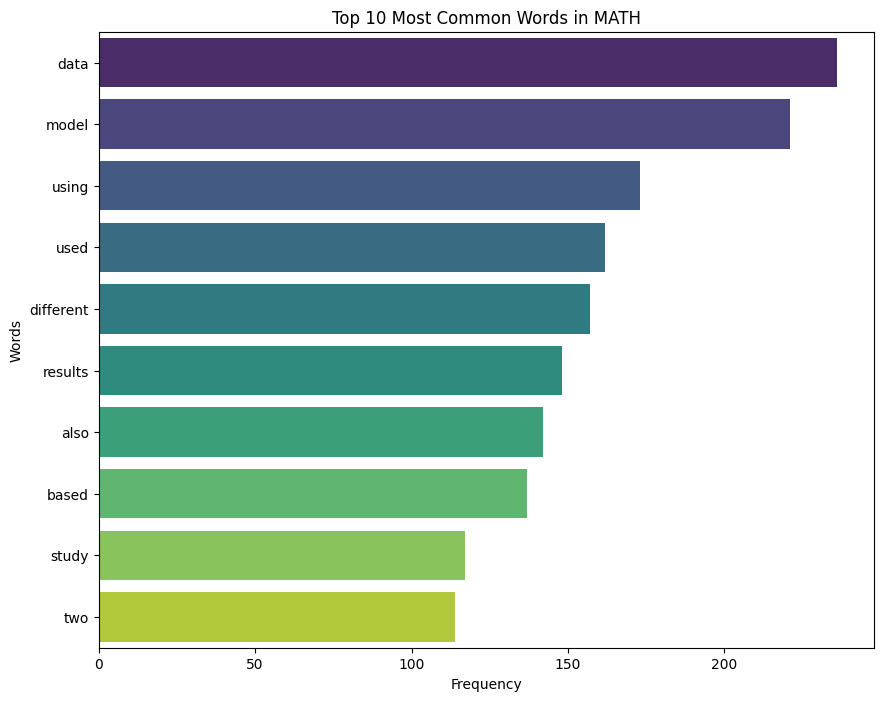

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




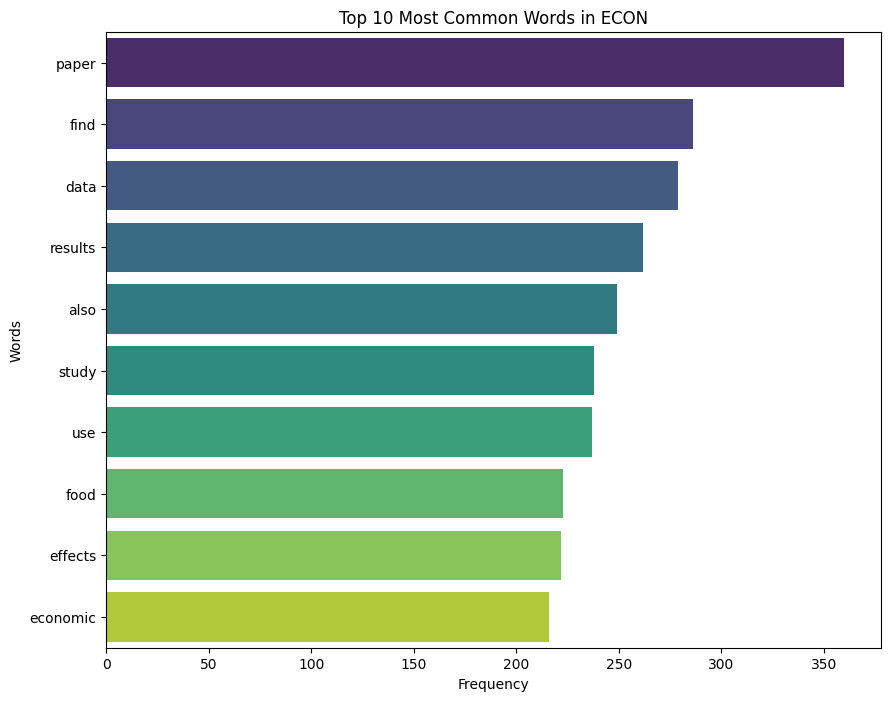

<ipython-input-36-15bd462fff9c>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




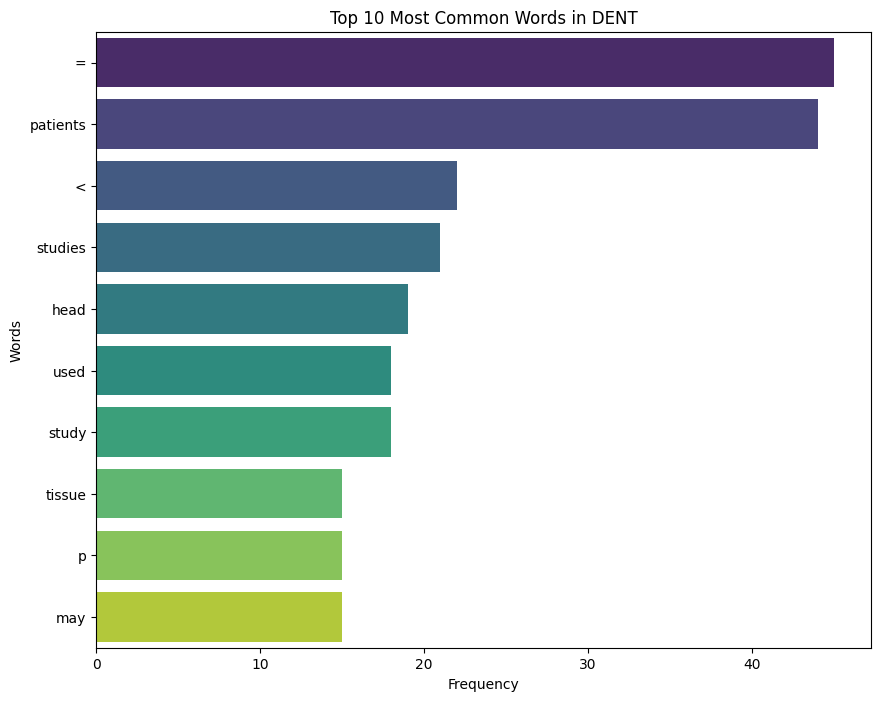

In [ ]:

N = 10

for area, texts in subj_area_abstracts.items():
    words = [word for word in texts.split() if word.lower() not in stop_words]
    word_freq = Counter(words).most_common(N)

    words, frequencies = zip(*word_freq)
    words = list(words)
    frequencies = list(frequencies)

    # Create a bar plot
    plt.figure(figsize=(10, 8))
    sns.barplot(x=frequencies, y=words, palette='viridis')
    plt.title(f'Top {N} Most Common Words in {area}')
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()
